## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---


## Import all necessary libraries

In [94]:
import numpy as np
import cv2
import glob
import pickle
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from moviepy.editor import VideoFileClip
from IPython.display import HTML

### Defining Hyperparameters

In [95]:
# HYPERPARAMETERS
# Choose the number of sliding windows
NWINDOWS = 10
# Set the width of the windows +/- margin
MARGIN = 80
# Set minimum number of pixels found to recenter window
MINPIX = 10
# Set meters per pixel in y dimension
YM_PER_PIX = 30/720 
# Set meters per pixel in x dimension
XM_PER_PIX = 3.7/700 
# Polynomial fit functions for left & right lane line
LEFT_FIT = []
RIGHT_FIT = []

## Compute the camera calibration matrix and distortion coefficients 

* using chessboard images in **camera_cal** folder.

In [140]:
%%HTML
<style> code {background-color : pink !important;} </style>

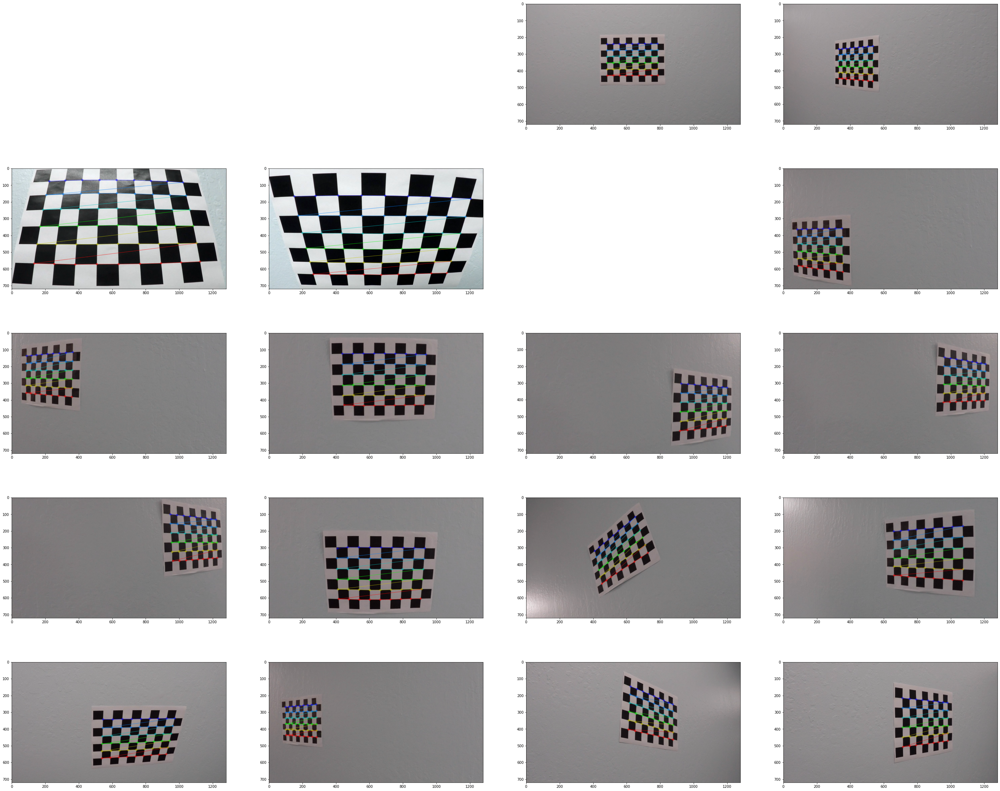

In [97]:
# Chessboard Size: 9 x 6 corners
# %matplotlib qt

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('camera_cal/calibration*.jpg')

# Step through the list and search for chessboard corners
columns = 4  # no. of images to be printed in each column
plt.rcParams["figure.figsize"] = (50,50)
plt.tight_layout()
for i, fname in enumerate(images):
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
        plt.subplot(len(images) / columns + 1, columns, i + 1)
        plt.imshow(img)

### If the above cell ran sucessfully, we should now have `objpoints` and `imgpoints` needed for camera calibration.  

Use the **cal_undistort** function below to undsitort any image for the camera. 

In [142]:
def cal_undistort(img, objpoints, imgpoints):
    # The function takes an image, object points, and image points
    # performs the camera calibration, image distortion correction and returns the undistorted image
    
    gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    
    return undist, mtx, dst

### Test distortion correction coefficients on a raw image

Make sure you use the correct grayscale conversion depending on how you've read in your images. 
* Use cv2.COLOR_RGB2GRAY if you've read in an image using mpimg.imread(). 
* Use cv2.COLOR_BGR2GRAY if you've read in an image using cv2.imread().


Text(0.5, 1.0, 'Undistorted Image')

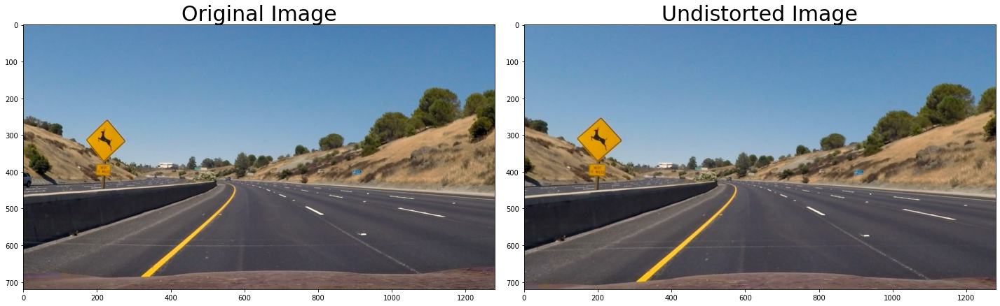

In [144]:
%matplotlib inline

# Test undistortion on an image
#img = cv2.imread('camera_cal/calibration1.jpg')
#img = cv2.imread('test_images/signs_vehicles_xygrad.png')
#img = mpimg.imread('camera_cal/calibration5.jpg')
#img = mpimg.imread('test_images/signs_vehicles_xygrad.jpg')
#img = mpimg.imread('test_images/straight_lines2.jpg')
img = mpimg.imread('test_images/test2.jpg')


img_size = (img.shape[1], img.shape[0])
gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)

undist, mtx, dst = cal_undistort(img, objpoints, imgpoints)
# Save calibration parameteres as Hyperparameters
MTX = mtx
DIST = dist

#undist = cal_undistort(img, objpoints, imgpoints)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(undist)
ax2.set_title('Undistorted Image', fontsize=30)

## Perspective transform 

In [106]:
def dewarp(img, src, dst):
    ##Input undistorted image
    undistorted = np.copy(img)
    img_size = (undistorted.shape[1],undistorted.shape[0])
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    warped = cv2.warpPerspective(undistorted, M, img_size, flags=cv2.INTER_LINEAR)
    
    return warped, M, Minv

Text(0.5, 1.0, 'Perspective transformed image')

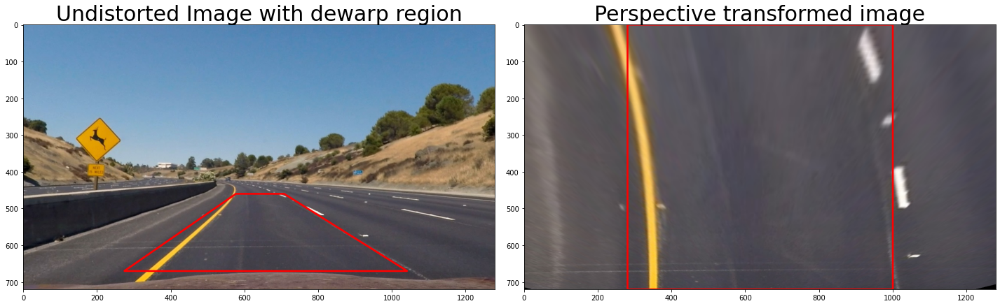

In [107]:
# Define ROI for Perspective transform in the undistorted image

sl_bot = [274,670]
sl_top = [577,460]
sr_bot = [1042,670]
sr_top = [708,460]

xsize =  undist.shape[1]
ysize =  undist.shape[0]
xwarp = 280

dl_bot = [xwarp,ysize]
dl_top = [xwarp,0]
dr_bot = [xsize-xwarp,ysize]
dr_top = [xsize-xwarp,0]

src = np.float32([sl_bot,sl_top,sr_bot,sr_top])
dst = np.float32([dl_bot,dl_top,dr_bot,dr_top])  
top_down, perspective_M, perspective_Minv = dewarp(undist, src, dst)

# save src & dst as Hyperparameters
SRC = src
DST = dst

# plot undistorted image marked with source points
pt_src = np.array([sl_bot,sl_top,sr_top,sr_bot], np.int32)
pt_src = pt_src.reshape((-1,1,2))
undist_poly = cv2.polylines(undist.copy(),[pt_src],True,(255,0,0), thickness=3)

# plot warped image marked with destination points
pt_dst = np.array([dl_bot,dl_top,dr_top,dr_bot], np.int32)
pt_dst = pt_dst.reshape((-1,1,2))
top_down = cv2.polylines(top_down.copy(),[pt_dst],True,(255,0,0), thickness=3)


f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
f.tight_layout()
ax1.imshow(undist_poly)
ax1.set_title('Undistorted Image with dewarp region', fontsize=30)
ax2.imshow(top_down)
ax2.set_title('Perspective transformed image', fontsize=30)

## Combine gradients & S Color thresholds to create a thresholded binary image.

### Combine all gradients 

In [108]:
def abs_sobel_thresh(img, orient='x', sobel_kernel=3, sob_thresh=(0, 255)):    
    # Calculate directional gradient
    # Apply threshold

    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    #gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # Apply x or y gradient with the OpenCV Sobel() function
    # and take the absolute value
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel))
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # Create a copy and apply the threshold
    grad_binary = np.zeros_like(scaled_sobel)
    # Here I'm using inclusive (>=, <=) thresholds, but exclusive is ok too
    grad_binary[(scaled_sobel >= sob_thresh[0]) & (scaled_sobel <= sob_thresh[1])] = 1

    # Return the result
    return grad_binary

def mag_threshold(img, sobel_kernel=3, mag_thresh=(0, 255)):
    # Calculate gradient magnitude
    # Apply threshold
    
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    mag_binary = np.zeros_like(gradmag)
    mag_binary[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1

    # Return the binary image
    return mag_binary

def dir_threshold(img, sobel_kernel=3, dir_thresh=(0, np.pi/2)):
    # Calculate gradient direction
    # Apply threshold
    
    # Grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    dir_binary =  np.zeros_like(absgraddir)
    dir_binary[(absgraddir >= dir_thresh[0]) & (absgraddir <= dir_thresh[1])] = 1

    # Return the binary image
    return dir_binary

**Tune and test gradient thresholds on a sample image**

Text(0.5, 1.0, 'Direction Gradient')

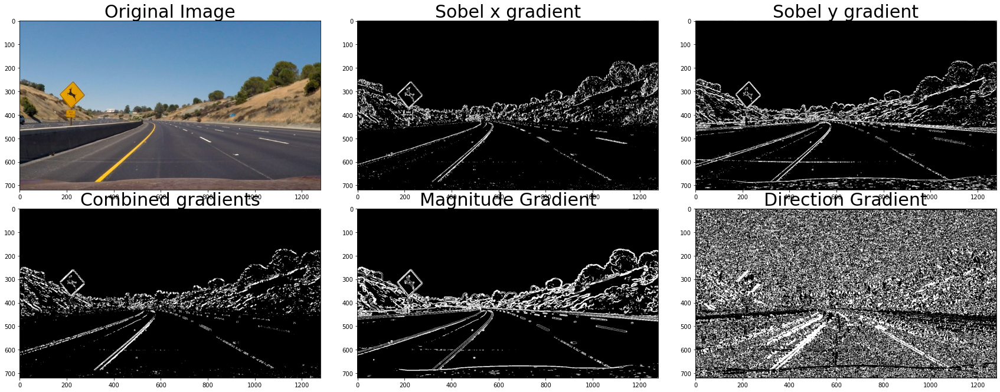

In [109]:
# Read in an image and grayscale it
#image = mpimg.imread('test_images/test4.jpg')
image = img.copy()
#img = cv2.imread('test_images/signs_vehicles_xygrad.png')
# Choose a Sobel kernel size
# ksize = 9 # Choose a larger odd number to smooth gradient measurements

# Apply each of the thresholding functions
gradx = abs_sobel_thresh(image, orient='x', sobel_kernel=3, sob_thresh=(20, 100))
grady = abs_sobel_thresh(image, orient='y', sobel_kernel=3, sob_thresh=(20, 100))
mag_binary = mag_threshold(image, sobel_kernel=9, mag_thresh=(30, 100))
dir_binary = dir_threshold(image, sobel_kernel=15, dir_thresh=(0.7, 1.3))

combined_grad = np.zeros_like(dir_binary)
#combined = np.zeros((dir_binary.shape[0], dir_binary.shape[1], 3), dtype=np.uint8)
combined_grad[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1


f, [(ax1, ax2, ax3), (ax4, ax5, ax6)] = plt.subplots(2, 3, figsize=(24,9))
f.tight_layout()

ax1.imshow(image)
ax1.set_title('Original Image', fontsize=30)
ax4.imshow(combined_grad, cmap='gray')
ax4.set_title('Combined gradients', fontsize=30)

ax2.imshow(gradx, cmap='gray')
ax2.set_title('Sobel x gradient', fontsize=30)
ax3.imshow(grady, cmap='gray')
ax3.set_title('Sobel y gradient', fontsize=30)

ax5.imshow(mag_binary, cmap='gray')
ax5.set_title('Magnitude Gradient', fontsize=30)
ax6.imshow(dir_binary, cmap='gray')
ax6.set_title('Direction Gradient', fontsize=30)

## Define HLS & Color thresholds

In [110]:
def hls_select(img, thresh=(0, 255)):
    # Define a function that thresholds the S-channel of HLS
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]
    # print (s_channel)
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel > thresh[0]) & (s_channel <= thresh[1])] = 1
    # plt.imshow(s_binary, cmap='gray')
    return s_binary

### Test & tune HLS thresholds

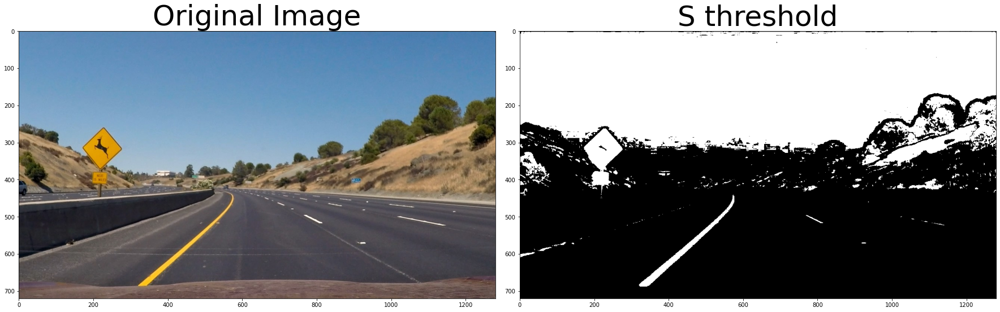

In [111]:
# Read in an image
#image = mpimg.imread('test_images/test5.jpg')

# Generate s color binary image
s_binary = hls_select(image, thresh=(90, 255))

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(s_binary, cmap='gray')
ax2.set_title('S threshold', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)


### Combine color & gradient thresholds

In [112]:
def combine_col_grad(img, s_thresh=(0, 255), sob_thresh = (0,255), mag_thresh=(0,255), dir_thresh=(0, np.pi/2)):
    # Read in an image
    #image = mpimg.imread('test_images/test4.jpg')
    image = np.copy(img)
    # Apply thresholding functions on Gradients and combine them
    gradx = abs_sobel_thresh(image, orient='x', sobel_kernel=3, sob_thresh=(sob_thresh[0], sob_thresh[1]))
    grady = abs_sobel_thresh(image, orient='y', sobel_kernel=3, sob_thresh=(sob_thresh[0], sob_thresh[1]))
    mag_binary = mag_threshold(image, sobel_kernel=9, mag_thresh=(mag_thresh[0], mag_thresh[1]))
    dir_binary = dir_threshold(image, sobel_kernel=15, dir_thresh=(dir_thresh[0], dir_thresh[1]))

    combined_grad = np.zeros_like(dir_binary)
    #combined = np.zeros((dir_binary.shape[0], dir_binary.shape[1], 3), dtype=np.uint8)
    combined_grad[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1

    # Apply threshold on s-color channel
    s_binary = hls_select(image, thresh=(90, 255))
    
    # Stack each channel to view their individual contributions in green and blue respectively
    # This returns a stack of the two binary images, whose components you can see as different colors
    # color_binary = np.dstack(( np.zeros_like(combined_grad), combined_grad, s_binary)) * 255

    # Combine the two binary thresholds
    combined_binary = np.zeros_like(s_binary)
    combined_binary[(s_binary == 1) | (combined_grad == 1)] = 1
  
    return combined_binary

### Test s-color threshold & gradient threshold

Text(0.5, 1.0, 'Combined S channel and gradient thresholds')

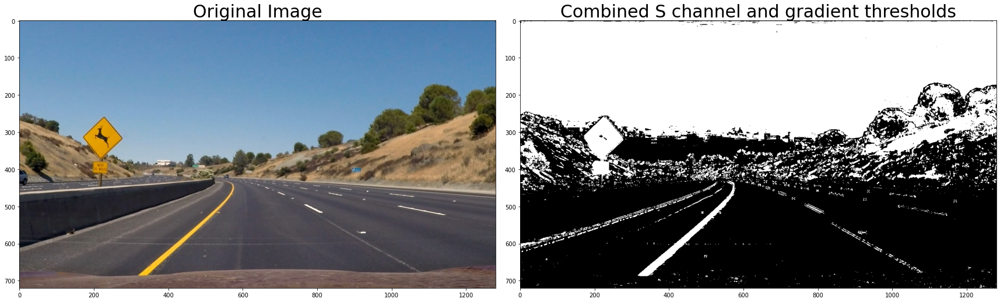

In [113]:
colors_gradients = combine_col_grad(image, s_thresh=(0, 255), sob_thresh = (20,100), mag_thresh=(30,100), dir_thresh=(0.7, 1.3))

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24,9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(colors_gradients, cmap = 'gray')
ax2.set_title('Combined S channel and gradient thresholds', fontsize=30)

### Perspective transform of the combined threshold image

Text(0.5, 1.0, 'Perspective Transform on Thresholded image')

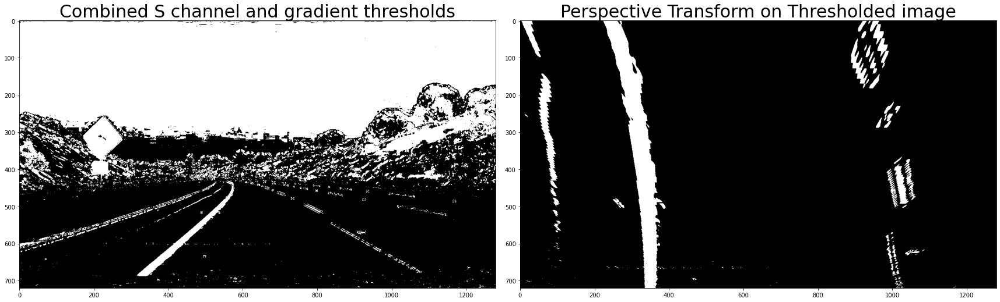

In [114]:
img_size = (colors_gradients.shape[1],colors_gradients.shape[0])
perspective_binary = cv2.warpPerspective(colors_gradients.copy(), perspective_M, img_size, flags=cv2.INTER_LINEAR)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24,9))
f.tight_layout()
ax1.imshow(colors_gradients, cmap = 'gray')
ax1.set_title('Combined S channel and gradient thresholds', fontsize=30)
ax2.imshow(perspective_binary, cmap = 'gray')
ax2.set_title('Perspective Transform on Thresholded image', fontsize=30)

### Define Histogram function

In [115]:
def hist(img):
    # Grab only the bottom half of the image
    # Lane lines are likely to be mostly vertical nearest to the car
    bottom_half = img[img.shape[0]//2:,:]

    # Sum across image pixels vertically - make sure to set an `axis`
    # i.e. the highest areas of vertical lines should be larger values
    histogram = np.sum(bottom_half, axis=0)
    
    return histogram

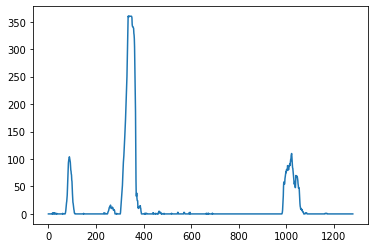

In [116]:
histogram = hist(perspective_binary)
plt.plot(histogram)

In [117]:
midpoint = np.int(histogram.shape[0]//2)
leftx_base = np.argmax(histogram[:midpoint])
rightx_base = np.argmax(histogram[midpoint:]) + midpoint

print ('left base', leftx_base)
print ('right base', rightx_base)

left base 335
right base 1022


### Detect lane pixels and fit to find the lane boundary.

In [118]:
## using the functions defined in Advanced CV lesson. 

def find_lane_pixels(binary_warped): 
    ## img = binary image with perspective transformed. 
    #binary_warped = img.copy()
    # Take a histogram of the bottom half of the image
    histogram = hist(binary_warped)
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # HYPERPARAMETERS
    # Choose the number of sliding windows
    nwindows = NWINDOWS
    # Set the width of the windows +/- margin
    margin = MARGIN
    # Set minimum number of pixels found to recenter window
    minpix = MINPIX

    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        ### TO-DO: Find the four below boundaries of the window ###
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),
        (win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),
        (win_xright_high,win_y_high),(0,255,0), 2) 
        
        ### TO-DO: Identify the nonzero pixels in x and y within the window ###
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        ### TO-DO: If you found > minpix pixels, recenter next window ###
        ### (`right` or `leftx_current`) on their mean position ###
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    return leftx, lefty, rightx, righty, out_img

def plot_lane_lines(img, left_fit, right_fit):
    
    img_lane_lines = np.copy(img)
    # Generate x and y values for plotting
    ploty = np.linspace(0, img.shape[0]-1, img.shape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty

    # Plot the left and right polynomials on the lane lines
    left_line = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    right_line = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((left_line, right_line))
                       
    cv2.polylines(img_lane_lines, np.int32([left_line]), isClosed=False,
                  color=(255, 255, 0), thickness=10)
    cv2.polylines(img_lane_lines, np.int32([right_line]), isClosed=False,
                  color=(255, 255, 0), thickness= 10)
    
    return img_lane_lines, pts

def fit_polynomial(binary_warped):
    
    ## img = binary image with perspective transformed. 
    #binary_warped = img.copy()
    
    # Find our lane pixels first
    leftx, lefty, rightx, righty, out_img = find_lane_pixels(binary_warped)
    
    ## Visualization ##
    # Colors in the left and right lane regions
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]
    
    ### TO-DO: Fit a second order polynomial to each using `np.polyfit` ###
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    #ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    
    out_img, line_pts = plot_lane_lines(out_img, left_fit, right_fit)
    return out_img
    

Text(0.5, 1.0, 'Perspective Transform on Thresholded image')

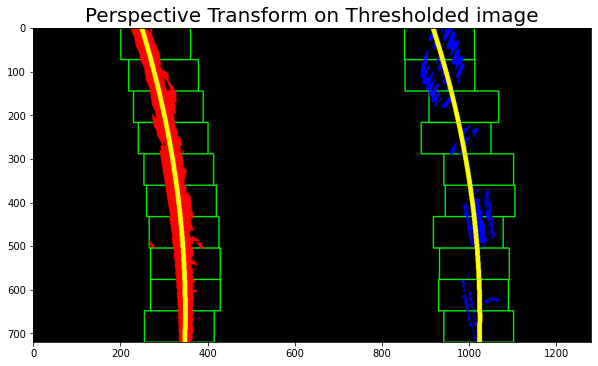

In [119]:
polyfit_warped = fit_polynomial(perspective_binary)

plt.rcParams["figure.figsize"] = (10,10)
plt.imshow(polyfit_warped)
plt.title('Perspective Transform on Thresholded image', fontsize=20)

### Skip the sliding windows step once you've found the lines

In [120]:
def fit_poly(img_shape, leftx, lefty, rightx, righty):
     ### TO-DO: Fit a second order polynomial to each with np.polyfit() ###
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, img_shape[0]-1, img_shape[0])
    ### TO-DO: Calc both polynomials using ploty, left_fit and right_fit ###
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    
    
    return left_fit, right_fit, left_fitx, right_fitx, ploty

def search_around_poly(binary_warped, left_fit, right_fit):
    # HYPERPARAMETER
    # Choose the width of the margin around the previous polynomial to search
    margin = MARGIN-10

    # Grab activated pixels
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    ### TO-DO: Set the area of search based on activated x-values ###
    ### within the +/- margin of our polynomial function ###
    ### Hint: consider the window areas for the similarly named variables ###
    ### in the previous quiz, but change the windows to our new search area ###
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
                    left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
                    left_fit[1]*nonzeroy + left_fit[2] + margin)))
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
                    right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
                    right_fit[1]*nonzeroy + right_fit[2] + margin)))
    
    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    
    # Fit new polynomials
    left_fitn, right_fitn, left_fitx, right_fitx, ploty = fit_poly(binary_warped.shape, leftx, lefty, rightx, righty)
    
    # update polynomial functions
    global LEFT_FIT, RIGHT_FIT
    LEFT_FIT = left_fitn
    RIGHT_FIT = right_fitn
    print ('LEFT_FIT & RIGHT_FIT were updated during the function search_around_poly call')
    
    ## Visualization ##
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    out_img, line_pts = plot_lane_lines(out_img, left_fitn, right_fitn)
    
    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                              ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                              ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    
    # Plot the polynomial lines onto the image
    #plt.plot(left_fitx, ploty, color='yellow')
    #plt.plot(right_fitx, ploty, color='yellow')
    ## End visualization steps ##
    
    return result

LEFT_FIT & RIGHT_FIT were updated during the function search_around_poly call


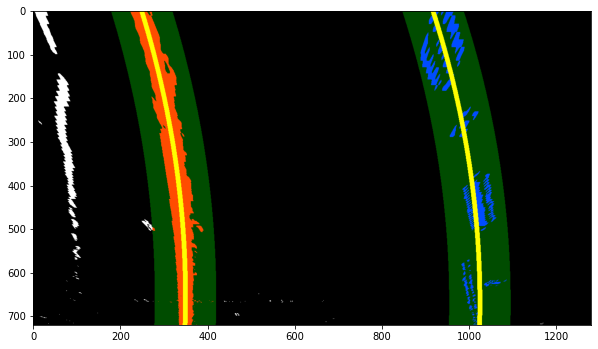

In [121]:
# Run image through the pipeline
# Note that in your project, you'll also want to feed in the previous fits

leftx, lefty, rightx, righty, out_img = find_lane_pixels(perspective_binary)
### TO-DO: Fit a second order polynomial to each using `np.polyfit` ###
left_fit = np.polyfit(lefty, leftx, 2)
right_fit = np.polyfit(righty, rightx, 2)

poly_perspective = search_around_poly(perspective_binary, left_fit, right_fit)

# View your output
plt.imshow(poly_perspective)
#print (LEFT_FIT)
#perspective_size = (poly_perspective.shape[1], poly_perspective.shape[0])
#unwarped = cv2.warpPerspective(poly_perspective, perspective_Minv, perspective_size, flags=cv2.INTER_LINEAR)
#plt.imshow(unwarped)

### Determine the curvature of the lane and vehicle position with respect to center.

In [122]:
def measure_curvature_pixels(img, left_fit, right_fit):
    '''
    Calculates the curvature of polynomial functions in pixels.
    '''
    # Define y-value where we want radius of curvature
    # Choose the maximum y-value, corresponding to the bottom of the image
    # y_eval = np.max(ploty)
    height = img.shape[0]
    ##### TO-DO: Implement the calculation of R_curve (radius of curvature) #####
    # Calculation of R_curve (radius of curvature)
    left_curverad = ((1 + (2*left_fit[0]*height + left_fit[1])**2)**1.5) / np.absolute(2*left_fit[0])
    right_curverad = ((1 + (2*right_fit[0]*height + right_fit[1])**2)**1.5) / np.absolute(2*right_fit[0])

    return left_curverad, right_curverad

In [123]:
# Calculate the radius of curvature in pixels for both lane lines
left_curverad, right_curverad = measure_curvature_pixels(perspective_binary, left_fit, right_fit)

print(left_curverad, right_curverad)

2148.729011744831 2059.4049713528007


In [124]:
def measure_curvature_real(img, left_fit, right_fit):
    '''
    Calculates the curvature of polynomial functions in meters.
    '''
    # Define conversions in x and y from pixels space to meters
    # Grab activated pixels
    nonzero = perspective_binary.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = MARGIN 
    ### TO-DO: Set the area of search based on activated x-values ###
    ### within the +/- margin of our polynomial function ###
    ### Hint: consider the window areas for the similarly named variables ###
    ### in the previous quiz, but change the windows to our new search area ###
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
                    left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
                    left_fit[1]*nonzeroy + left_fit[2] + margin)))
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
                    right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
                    right_fit[1]*nonzeroy + right_fit[2] + margin)))

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]


    ym_per_pix = YM_PER_PIX # meters per pixel in y dimension
    xm_per_pix = XM_PER_PIX # meters per pixel in x dimension

    left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
    
    # Start by generating our fake example data
    # Make sure to feed in your real data instead in your project!
    #ploty, left_fit_cr, right_fit_cr = generate_data(ym_per_pix, xm_per_pix)
    
    # Define y-value where we want radius of curvature
    # We'll choose the maximum y-value, corresponding to the bottom of the image
    height = img.shape[0]
    ##### TO-DO: Implement the calculation of R_curve (radius of curvature) #####
    left_curverad = ((1 + (2*left_fit_cr[0]*height*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*height*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    
    return left_curverad, right_curverad

def vehicle_offset(img, left_fit, right_fit):
    
    xm_per_pix = XM_PER_PIX
    ## For the position of the vehicle, you may assume the camera is mounted at the center of the car and the
    ## deviation of the midpoint of the lane from the center of the image is the offset you're looking for. 
    width = img.shape[1]
    height = img.shape[0]
    leftx_bot = ((left_fit[0])*(height**2) + left_fit[1]*height + left_fit[2])
    rightx_bot = ((right_fit[0])*(height**2) + right_fit[1]*height + right_fit[2])
    
    midpoint_lane = (leftx_bot + rightx_bot)//2
    midpoint_image = width//2

    offset = (midpoint_image - midpoint_lane)*xm_per_pix
    
    #print (midpoint_lane*xm_per_pix, midpoint_image*xm_per_pix)
    
    return offset

In [125]:
# Calculate the radius of curvature in meters for both lane lines
left_curverad, right_curverad = measure_curvature_real(perspective_binary, left_fit, right_fit)
curverad = (left_curverad + right_curverad)/2
offset = vehicle_offset(perspective_binary, left_fit, right_fit)
print(curverad, 'm', left_curverad, 'm', right_curverad, 'm', offset*100, 'cm')


696.953564215221 m 712.8040316142987 m 681.1030968161434 m -24.314285714285717 cm


In [126]:
# Check if the polynomial detected is valid lane line 

def valid_lane(warp_shape, left_fit, right_fit):
    validated = False
    
    ### Ensure that lane width @top & bottom of image is valid > 600 pixels & <750 pixels
    ysize = warp_shape[0]
     
    leftx_bot = left_fit[0]*ysize**2 + left_fit[1]*ysize + left_fit[2]
    rightx_bot = right_fit[0]*ysize**2 + right_fit[1]*ysize + right_fit[2]
    
    lane_width_bot = rightx_bot - leftx_bot
    if (lane_width_bot>600 and lane_width_bot<750):
        width_bot = True
    else:
        width_bot = False
        print ('Invalid polyfit: lane width at the bottom is incorrect')
    
    leftx_top = left_fit[2] ## y co-ordinate = 0
    rightx_top = right_fit[2] ## y co-ordinate = 0
    lane_width_top = rightx_top - leftx_top
    if (lane_width_top>300 and lane_width_top<800):
        width_top = True
    else:
        width_top = False
        print ('Invalid polyfit: lane width at the top is incorrect')
    
    # print (lane_width_bot, lane_width_top)
    width = (width_bot and width_top)
    
    ## Ensure that left lane is in left region 
    if (leftx_bot<400 and rightx_bot>800):
        location = True
    else:
        location = False
        print ('Invalid polyfit: lanes boundaries are out of expected region')
    
    validated = width and location
    ## Ensure that right lane is in right region
    print (' function valid_laneoutput = ', validated)
   
    return validated

### Plot lanes back on the original image

In [127]:
def plot_poly_window(img, perspective_binary, Minv):
    global LEFT_FIT, RIGHT_FIT
    
    # undist = cv2.undistort(img, mtx, dist)
    warp_zero = np.zeros_like(perspective_binary).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    
    #polyfit_warped = fit_polynomial(perspective_binary)
    
    leftx, lefty, rightx, righty, out_img = find_lane_pixels(perspective_binary)
    ### TO-DO: Fit a second order polynomial to each using `np.polyfit` ###
    left_fit, right_fit, left_fitx, right_fitx, ploty = fit_poly(perspective_binary.shape, leftx, lefty, rightx, righty)
    
    is_valid_lane = valid_lane(perspective_binary.shape, left_fit, right_fit)
    #print (is_valid_lane)
        
    if is_valid_lane==True:
        # update global polynomial functions
        LEFT_FIT = left_fit
        RIGHT_FIT = right_fit
        print ('LEFT_FIT & RIGHT_FIT were updated during the function plot_poly_window call')

        color_warp, line_pts = plot_lane_lines(color_warp, left_fit, right_fit)
        cv2.fillPoly(color_warp, np.int_([line_pts]), (0, 255, 0))
        perspective_size = (perspective_binary.shape[1], perspective_binary.shape[0])
        unwarped = cv2.warpPerspective(color_warp, perspective_Minv, perspective_size, flags=cv2.INTER_LINEAR)

        img_lanes = cv2.addWeighted(img, 1, unwarped, 0.4, 0)

        offset = vehicle_offset(perspective_binary, left_fit, right_fit)
        #Write vehicle offset on the output image
        direction = ''
        if offset < 0:
            direction = 'left'
        elif offset > 0:
            direction = 'right'

        text = 'Vehicle position: {:0.1f} cm {} of center'.format(abs(offset) * 100, direction)
        cv2.putText(img_lanes, text, (50, 110), cv2.FONT_HERSHEY_DUPLEX, 1.2, (255, 255, 255), 2, cv2.LINE_AA)

        left_curverad, right_curverad = measure_curvature_real(perspective_binary, left_fit, right_fit)
        curverad = (left_curverad + right_curverad)/2
        #Write curvature on the output image 
        text = 'Radius of curvature: {:0.1f} m'.format(curverad)
        cv2.putText(img_lanes, text, (50, 50), cv2.FONT_HERSHEY_DUPLEX, 1.2, (255, 255, 255), 2, cv2.LINE_AA)
    
    else:
        # update global polynomial functions
        LEFT_FIT = left_fit
        RIGHT_FIT = right_fit
        print ('Polynomial fit functions are not valid')


        color_warp, line_pts = plot_lane_lines(color_warp, left_fit, right_fit)
        cv2.fillPoly(color_warp, np.int_([line_pts]), (0, 255, 0))
        perspective_size = (perspective_binary.shape[1], perspective_binary.shape[0])
        unwarped = cv2.warpPerspective(color_warp, perspective_Minv, perspective_size, flags=cv2.INTER_LINEAR)

        img_lanes = cv2.addWeighted(img, 1, unwarped, 0.4, 0)

        offset = vehicle_offset(perspective_binary, left_fit, right_fit)
        #Write vehicle offset on the output image
        direction = ''
        if offset < 0:
            direction = 'left'
        elif offset > 0:
            direction = 'right'

        text = 'Vehicle position: {:0.1f} cm {} of center'.format(abs(offset) * 100, direction)
        cv2.putText(img_lanes, text, (50, 110), cv2.FONT_HERSHEY_DUPLEX, 1.2, (255, 255, 255), 2, cv2.LINE_AA)

        left_curverad, right_curverad = measure_curvature_real(perspective_binary, left_fit, right_fit)
        curverad = (left_curverad + right_curverad)/2
        #Write curvature on the output image 
        text = 'Radius of curvature: {:0.1f} m'.format(curverad)
        cv2.putText(img_lanes, text, (50, 50), cv2.FONT_HERSHEY_DUPLEX, 1.2, (255, 255, 255), 2, cv2.LINE_AA)
    
    return img_lanes

[-2.33667731e-04  3.06156740e-01  2.49560724e+02]
 function valid_laneoutput =  True
LEFT_FIT & RIGHT_FIT were updated during the function plot_poly_window call
[-2.33029379e-04  3.04647007e-01  2.49751330e+02]


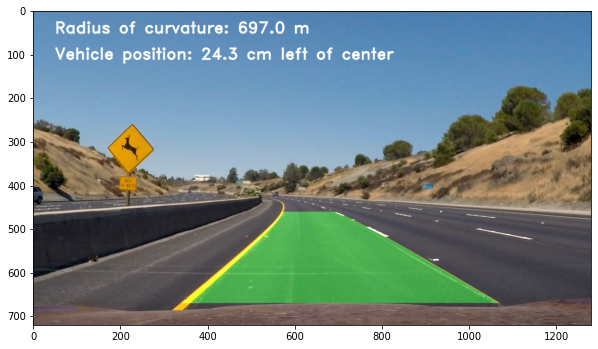

In [128]:
print (LEFT_FIT)
img_lanes = plot_poly_window(img, perspective_binary, perspective_Minv)
plt.imshow(img_lanes)
print (LEFT_FIT)

# Video Pipeline

In [129]:
## Recall Hyperparameters

# Perspective transform parameters
src = SRC
dst = DST
# Distortion parameters
mtx = MTX
dist = DIST

# Reset polynomial functions
LEFT_FIT = []
RIGHT_FIT = []

def pipeline(img):
    '''
    #Step0: undist = undistort (image)
    #Step1: warped = perspective transform (undist)
    #Step2: binary_warped = color & gradient (warped)
    #Step3: lines_binary = plot left & right lines on an empty binary image
    #Step4: color_binary = fill the lane with green color 
    #Step5: img_lanes = unwarp color_binary and overlay on original image
    #Step6: out_image = add curvature & vehicle offset on img_lines
    '''

    image = np.copy(img)

    #Step1: Get combined threshold image using gradient & color thresholds. 
    combined_thresholds = combine_col_grad(image, s_thresh=(0, 255), sob_thresh = (20,100), mag_thresh=(30,100), dir_thresh=(0.7, 1.3))
    
    #Step2: Undistort combined threshold image
    binary_undist = cv2.undistort(combined_thresholds, mtx, dist, None, mtx)
    
    #Step3: binary_warped = perspective transform (binary_undist)
    binary_warped, M, Minv = dewarp(binary_undist, src, dst) 
    
    #Step4: img_lane
    img_lane = plot_poly_window(image, binary_warped, Minv)
    
    return img_lane

# LEFT_FIT & RIGHT_FIT were updated in the pipeline above


 function valid_laneoutput =  True
LEFT_FIT & RIGHT_FIT were updated during the function plot_poly_window call
 function valid_laneoutput =  True
LEFT_FIT & RIGHT_FIT were updated during the function plot_poly_window call
 function valid_laneoutput =  True
LEFT_FIT & RIGHT_FIT were updated during the function plot_poly_window call
 function valid_laneoutput =  True
LEFT_FIT & RIGHT_FIT were updated during the function plot_poly_window call
 function valid_laneoutput =  True
LEFT_FIT & RIGHT_FIT were updated during the function plot_poly_window call
 function valid_laneoutput =  True
LEFT_FIT & RIGHT_FIT were updated during the function plot_poly_window call


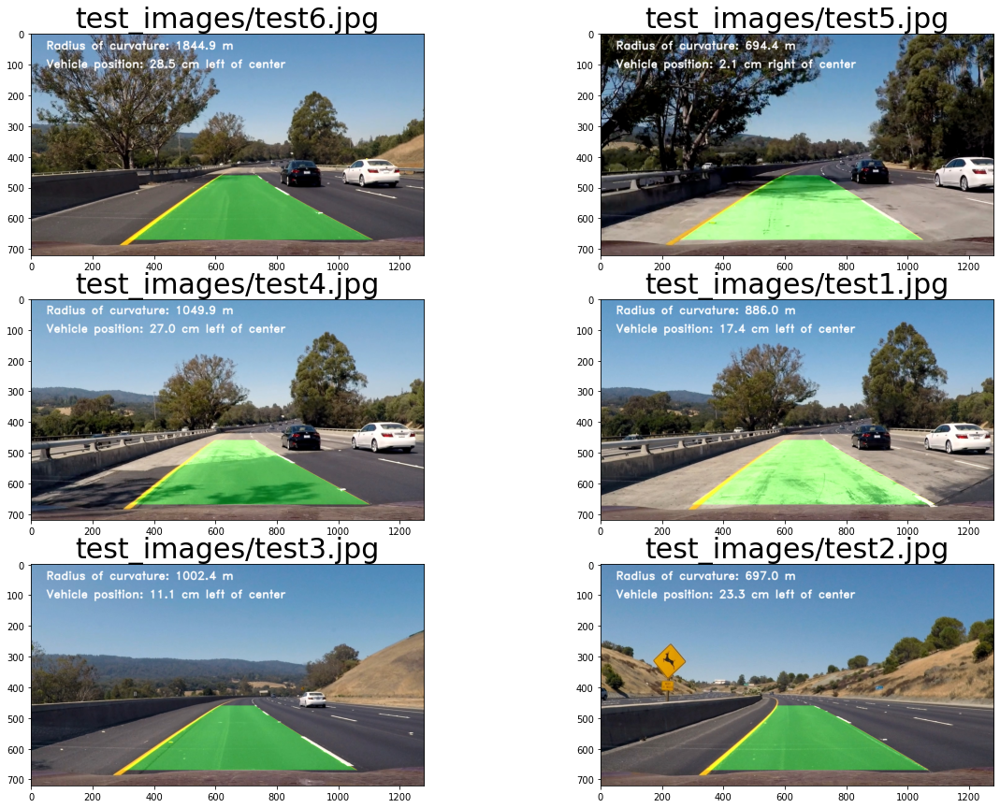

In [130]:
images = glob.glob('test_images/test*.jpg')

# Step through the list and search for chessboard corners
columns = 2  # no. of images to be printed in each column
plt.rcParams["figure.figsize"] = (20,20)

i = 0
for i, fname in enumerate(images):
    img = cv2.imread(fname)
    RGB_image = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    pipeline_out = pipeline (RGB_image)

    # Display output image with lane colored in Green
    plt.subplot(len(images) / columns + 1, columns, i + 1)
    plt.imshow(pipeline_out)
    plt.title(fname, fontsize=30)

## Test on Video

In [131]:
# Save consecutive frames in the subclip for testing. 
#nameformat= "consecutive_images/frame%d.jpg"
#vidcap = VideoFileClip("test_videos/challenge_video.mp4").subclip(4,5)
#vidcap.write_images_sequence(nameformat, fps=None, verbose=True, withmask=True, logger='bar')

In [132]:
def plot_search_around_poly(image, binary_warped, Minv, left_fit, right_fit):
    # Use valid polynomial fit from previous frame to search around margin in the next frame. 
    global LEFT_FIT, RIGHT_FIT
    
    img = np.copy(image)
    # HYPERPARAMETER
    # Choose the width of the margin around the previous polynomial to search
    margin = MARGIN-20

    # Grab activated pixels
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    ### TO-DO: Set the area of search based on activated x-values ###
    ### within the +/- margin of our polynomial function ###
    ### Hint: consider the window areas for the similarly named variables ###
    ### in the previous quiz, but change the windows to our new search area ###
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
                    left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
                    left_fit[1]*nonzeroy + left_fit[2] + margin)))
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
                    right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
                    right_fit[1]*nonzeroy + right_fit[2] + margin)))
    
    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    
    # Fit new polynomials
    left_fitn, right_fitn, left_fitx, right_fitx, ploty = fit_poly(binary_warped.shape, leftx, lefty, rightx, righty)
    
    is_valid_lane = valid_lane(binary_warped.shape, left_fitn, right_fitn)
    
    print ('valid lane output =',is_valid_lane)
    if is_valid_lane==True:
        warp_zero = np.zeros_like(binary_warped).astype(np.uint8)
        color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
        # update polynomial functions
        LEFT_FIT = left_fitn
        RIGHT_FIT = right_fitn
        print ('New polynomial fit function is valid and was updated in the search_around call')
    
        color_warp, line_pts = plot_lane_lines(color_warp, left_fitn, right_fitn)
        cv2.fillPoly(color_warp, np.int_([line_pts]), (0, 255, 0))
        perspective_size = (binary_warped.shape[1], binary_warped.shape[0])
        unwarped = cv2.warpPerspective(color_warp, perspective_Minv, perspective_size, flags=cv2.INTER_LINEAR)

        img_lanes = cv2.addWeighted(img, 1, unwarped, 0.4, 0)

        offset = vehicle_offset(binary_warped, left_fitn, right_fitn)
        #Write vehicle offset on the output image
        direction = ''
        if offset < 0:
            direction = 'left'
        elif offset > 0:
            direction = 'right'

        text = 'Vehicle position: {:0.1f} cm {} of center'.format(abs(offset) * 100, direction)
        cv2.putText(img_lanes, text, (50, 110), cv2.FONT_HERSHEY_DUPLEX, 1.2, (255, 255, 255), 2, cv2.LINE_AA)

        left_curverad, right_curverad = measure_curvature_real(perspective_binary, left_fit, right_fit)
        curverad = (left_curverad + right_curverad)/2
        #Write curvature on the output image 
        text = 'Radius of curvature: {:0.1f} m'.format(curverad)
        cv2.putText(img_lanes, text, (50, 50), cv2.FONT_HERSHEY_DUPLEX, 1.2, (255, 255, 255), 2, cv2.LINE_AA)    
    
    else:
        img_lanes = np.zeros_like(image).astype(np.uint8)
        print ('Updated polynomial is invalid: search_around_poly call')
    '''
    ## Visualization ##
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    out_img, line_pts = plot_lane_lines(out_img, left_fitn, right_fitn)
    
    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                              ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                              ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    ''' 
    
    return img_lanes, is_valid_lane

In [133]:
## Recall Hyperparameters

# Perspective transform parameters
src = SRC
dst = DST
# Distortion parameters
mtx = MTX
dist = DIST

# Reset polynomial functions
LEFT_FIT = []
RIGHT_FIT = []

RESET = True

def pipeline_memory(img):
    '''
    Steps to be defined. 
    '''
    global RESET
    image = np.copy(img)
    
    #Step1: Get combined threshold image using gradient & color thresholds. 
    combined_thresholds = combine_col_grad(image, s_thresh=(0, 255), sob_thresh = (20,100), mag_thresh=(30,100), dir_thresh=(0.7, 1.3))
    
    #Step2: Undistort combined threshold image
    binary_undist = cv2.undistort(combined_thresholds, mtx, dist, None, mtx)
    
    #Step3: binary_warped = perspective transform (binary_undist)
    binary_warped, M, Minv = dewarp(binary_undist, src, dst) 
    
    #Step4: img_lane
    #img_lane = plot_poly_window(image, binary_warped, Minv)
    if RESET==True:
        img_lane = plot_poly_window(image, binary_warped, Minv)
    else :
        left_fit = LEFT_FIT
        right_fit = RIGHT_FIT
        img_lane, is_valid_lane = plot_search_around_poly(image, binary_warped, Minv, left_fit, right_fit)
        if not is_valid_lane: # polynomial fit is not valid
            print ('valid lane not found in search around poly function')
            img_lane = plot_poly_window(image, binary_warped, Minv)
    
    RESET = False
    return img_lane
    #return combined_thresholds


In [88]:
RESET = True

white_output = 'test_videos_output/project_video_out_memory.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
clip1 = VideoFileClip("test_videos/project_video.mp4")#.subclip(39,40)
##clip1 = VideoFileClip("test_videos/project_video.mp4")
white_clip = clip1.fl_image(pipeline_memory) #NOTE: this function expects color images!!
%time white_clip.write_videofile(white_output, audio=False)



                                                                
t:   4%|▍         | 1/25 [38:03<15:13:33, 2283.91s/it, now=None][A
                                                                
t:   4%|▍         | 1/25 [38:03<15:13:34, 2283.94s/it, now=None][A

 function valid_laneoutput =  True
LEFT_FIT & RIGHT_FIT were updated during the function plot_poly_window call
Moviepy - Building video test_videos_output/project_video_out_memory.mp4.
Moviepy - Writing video test_videos_output/project_video_out_memory.mp4





t:   0%|          | 0/1260 [00:00<?, ?it/s, now=None]

t:   0%|          | 2/1260 [00:00<07:04,  2.97it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   0%|          | 3/1260 [00:01<08:53,  2.35it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   0%|          | 4/1260 [00:01<09:55,  2.11it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   0%|          | 5/1260 [00:02<10:26,  2.00it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   0%|          | 6/1260 [00:03<10:44,  1.94it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   1%|          | 7/1260 [00:03<10:57,  1.91it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   1%|          | 8/1260 [00:04<11:05,  1.88it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   1%|          | 9/1260 [00:04<11:13,  1.86it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   1%|          | 10/1260 [00:05<11:26,  1.82it/s, now=None]

Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
valid lane output = False
Updated polynomial is invalid: search_around_poly call
valid lane not found in search around poly function
Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
Polynomial fit functions are not valid




t:   1%|          | 11/1260 [00:05<11:21,  1.83it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   1%|          | 12/1260 [00:06<11:19,  1.84it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   1%|          | 13/1260 [00:06<11:20,  1.83it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   1%|          | 14/1260 [00:07<11:25,  1.82it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   1%|          | 15/1260 [00:07<11:16,  1.84it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   1%|▏         | 16/1260 [00:08<11:14,  1.84it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   1%|▏         | 17/1260 [00:09<11:16,  1.84it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   1%|▏         | 18/1260 [00:09<11:11,  1.85it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   2%|▏         | 19/1260 [00:10<11:24,  1.81it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   2%|▏         | 20/1260 [00:10<11:31,  1.79it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   2%|▏         | 21/1260 [00:11<11:35,  1.78it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   2%|▏         | 22/1260 [00:11<11:37,  1.77it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   2%|▏         | 23/1260 [00:12<11:30,  1.79it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   2%|▏         | 24/1260 [00:12<11:19,  1.82it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   2%|▏         | 25/1260 [00:13<11:09,  1.84it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   2%|▏         | 26/1260 [00:13<11:08,  1.85it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   2%|▏         | 27/1260 [00:14<11:16,  1.82it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   2%|▏         | 28/1260 [00:15<11:19,  1.81it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   2%|▏         | 29/1260 [00:15<11:53,  1.72it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   2%|▏         | 30/1260 [00:16<11:44,  1.75it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   2%|▏         | 31/1260 [00:16<11:33,  1.77it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   3%|▎         | 32/1260 [00:17<11:26,  1.79it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   3%|▎         | 33/1260 [00:17<11:18,  1.81it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   3%|▎         | 34/1260 [00:18<11:27,  1.78it/s, now=None]

Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
valid lane output = False
Updated polynomial is invalid: search_around_poly call
valid lane not found in search around poly function
 function valid_laneoutput =  True
LEFT_FIT & RIGHT_FIT were updated during the function plot_poly_window call




t:   3%|▎         | 35/1260 [00:19<11:33,  1.77it/s, now=None]

Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
valid lane output = False
Updated polynomial is invalid: search_around_poly call
valid lane not found in search around poly function
Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
Polynomial fit functions are not valid




t:   3%|▎         | 36/1260 [00:19<11:25,  1.79it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   3%|▎         | 37/1260 [00:20<11:18,  1.80it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   3%|▎         | 38/1260 [00:20<11:33,  1.76it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   3%|▎         | 39/1260 [00:21<11:23,  1.79it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   3%|▎         | 40/1260 [00:21<11:19,  1.80it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   3%|▎         | 41/1260 [00:22<11:11,  1.82it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   3%|▎         | 42/1260 [00:22<11:03,  1.83it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   3%|▎         | 43/1260 [00:23<11:01,  1.84it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   3%|▎         | 44/1260 [00:24<11:31,  1.76it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   4%|▎         | 45/1260 [00:24<11:29,  1.76it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   4%|▎         | 46/1260 [00:25<11:15,  1.80it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   4%|▎         | 47/1260 [00:25<11:10,  1.81it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   4%|▍         | 48/1260 [00:26<11:12,  1.80it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   4%|▍         | 49/1260 [00:26<11:33,  1.75it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   4%|▍         | 50/1260 [00:27<11:26,  1.76it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   4%|▍         | 51/1260 [00:28<11:28,  1.76it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   4%|▍         | 52/1260 [00:28<11:21,  1.77it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   4%|▍         | 53/1260 [00:29<11:40,  1.72it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   4%|▍         | 54/1260 [00:29<11:39,  1.73it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   4%|▍         | 55/1260 [00:30<11:46,  1.71it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   4%|▍         | 56/1260 [00:30<11:42,  1.71it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   5%|▍         | 57/1260 [00:31<11:58,  1.67it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   5%|▍         | 58/1260 [00:32<11:52,  1.69it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   5%|▍         | 59/1260 [00:32<11:48,  1.69it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   5%|▍         | 60/1260 [00:33<11:49,  1.69it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   5%|▍         | 61/1260 [00:33<11:42,  1.71it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   5%|▍         | 62/1260 [00:34<11:43,  1.70it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   5%|▌         | 63/1260 [00:35<11:51,  1.68it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   5%|▌         | 64/1260 [00:35<13:09,  1.51it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   5%|▌         | 65/1260 [00:36<13:59,  1.42it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   5%|▌         | 66/1260 [00:37<13:45,  1.45it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   5%|▌         | 67/1260 [00:37<12:55,  1.54it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   5%|▌         | 68/1260 [00:38<12:49,  1.55it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   5%|▌         | 69/1260 [00:39<12:51,  1.54it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   6%|▌         | 70/1260 [00:40<13:55,  1.42it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   6%|▌         | 71/1260 [00:40<13:23,  1.48it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   6%|▌         | 72/1260 [00:41<12:52,  1.54it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   6%|▌         | 73/1260 [00:41<12:23,  1.60it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   6%|▌         | 74/1260 [00:42<12:31,  1.58it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   6%|▌         | 75/1260 [00:43<12:05,  1.63it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   6%|▌         | 76/1260 [00:43<11:54,  1.66it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   6%|▌         | 77/1260 [00:44<11:56,  1.65it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   6%|▌         | 78/1260 [00:44<11:43,  1.68it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   6%|▋         | 79/1260 [00:45<11:38,  1.69it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   6%|▋         | 80/1260 [00:46<11:31,  1.71it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   6%|▋         | 81/1260 [00:46<12:00,  1.64it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   7%|▋         | 82/1260 [00:47<12:23,  1.58it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   7%|▋         | 83/1260 [00:47<12:07,  1.62it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   7%|▋         | 84/1260 [00:48<11:48,  1.66it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   7%|▋         | 85/1260 [00:49<11:57,  1.64it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   7%|▋         | 86/1260 [00:49<11:56,  1.64it/s, now=None]

Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
valid lane output = False
Updated polynomial is invalid: search_around_poly call
valid lane not found in search around poly function
Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
Polynomial fit functions are not valid




t:   7%|▋         | 87/1260 [00:50<12:07,  1.61it/s, now=None]

Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
valid lane output = False
Updated polynomial is invalid: search_around_poly call
valid lane not found in search around poly function
 function valid_laneoutput =  True
LEFT_FIT & RIGHT_FIT were updated during the function plot_poly_window call




t:   7%|▋         | 88/1260 [00:50<11:46,  1.66it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   7%|▋         | 89/1260 [00:51<11:50,  1.65it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   7%|▋         | 90/1260 [00:52<11:42,  1.67it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   7%|▋         | 91/1260 [00:52<11:36,  1.68it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   7%|▋         | 92/1260 [00:53<11:29,  1.69it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   7%|▋         | 93/1260 [00:54<12:40,  1.53it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   7%|▋         | 94/1260 [00:54<12:33,  1.55it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   8%|▊         | 95/1260 [00:55<12:19,  1.58it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   8%|▊         | 96/1260 [00:56<12:37,  1.54it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call
 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   8%|▊         | 97/1260 [00:56<14:12,  1.36it/s, now=None]

t:   8%|▊         | 98/1260 [00:57<13:48,  1.40it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   8%|▊         | 99/1260 [00:58<12:55,  1.50it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   8%|▊         | 100/1260 [00:58<12:48,  1.51it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   8%|▊         | 101/1260 [00:59<12:33,  1.54it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   8%|▊         | 102/1260 [01:00<12:12,  1.58it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   8%|▊         | 103/1260 [01:00<11:42,  1.65it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   8%|▊         | 104/1260 [01:01<11:44,  1.64it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   8%|▊         | 105/1260 [01:01<11:32,  1.67it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   8%|▊         | 106/1260 [01:02<11:22,  1.69it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   8%|▊         | 107/1260 [01:02<11:15,  1.71it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   9%|▊         | 108/1260 [01:03<11:27,  1.67it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   9%|▊         | 109/1260 [01:04<11:27,  1.67it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   9%|▊         | 110/1260 [01:04<11:16,  1.70it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   9%|▉         | 111/1260 [01:05<11:11,  1.71it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   9%|▉         | 112/1260 [01:05<11:26,  1.67it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   9%|▉         | 113/1260 [01:06<11:17,  1.69it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   9%|▉         | 114/1260 [01:07<11:08,  1.71it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   9%|▉         | 115/1260 [01:07<11:01,  1.73it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   9%|▉         | 116/1260 [01:08<11:17,  1.69it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   9%|▉         | 117/1260 [01:08<11:13,  1.70it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   9%|▉         | 118/1260 [01:09<11:31,  1.65it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:   9%|▉         | 119/1260 [01:10<12:21,  1.54it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  10%|▉         | 120/1260 [01:10<12:24,  1.53it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  10%|▉         | 121/1260 [01:11<11:52,  1.60it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  10%|▉         | 122/1260 [01:12<11:35,  1.64it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  10%|▉         | 123/1260 [01:12<11:37,  1.63it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  10%|▉         | 124/1260 [01:13<11:38,  1.63it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  10%|▉         | 125/1260 [01:13<11:20,  1.67it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  10%|█         | 126/1260 [01:14<11:07,  1.70it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  10%|█         | 127/1260 [01:14<10:57,  1.72it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  10%|█         | 128/1260 [01:15<11:08,  1.69it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  10%|█         | 129/1260 [01:16<11:09,  1.69it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  10%|█         | 130/1260 [01:16<10:59,  1.71it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  10%|█         | 131/1260 [01:17<10:55,  1.72it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  10%|█         | 132/1260 [01:17<10:59,  1.71it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  11%|█         | 133/1260 [01:18<10:51,  1.73it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  11%|█         | 134/1260 [01:19<10:50,  1.73it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  11%|█         | 135/1260 [01:19<10:48,  1.73it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  11%|█         | 136/1260 [01:20<11:04,  1.69it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  11%|█         | 137/1260 [01:20<11:02,  1.70it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  11%|█         | 138/1260 [01:21<10:51,  1.72it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  11%|█         | 139/1260 [01:21<10:51,  1.72it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  11%|█         | 140/1260 [01:22<11:21,  1.64it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  11%|█         | 141/1260 [01:23<11:08,  1.67it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  11%|█▏        | 142/1260 [01:23<10:56,  1.70it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  11%|█▏        | 143/1260 [01:24<10:50,  1.72it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  11%|█▏        | 144/1260 [01:24<11:06,  1.68it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  12%|█▏        | 145/1260 [01:25<11:04,  1.68it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  12%|█▏        | 146/1260 [01:26<10:57,  1.70it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  12%|█▏        | 147/1260 [01:26<10:56,  1.70it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  12%|█▏        | 148/1260 [01:27<11:09,  1.66it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  12%|█▏        | 149/1260 [01:27<11:03,  1.67it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  12%|█▏        | 150/1260 [01:28<10:53,  1.70it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  12%|█▏        | 151/1260 [01:29<10:49,  1.71it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  12%|█▏        | 152/1260 [01:29<11:02,  1.67it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  12%|█▏        | 153/1260 [01:30<11:00,  1.68it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  12%|█▏        | 154/1260 [01:30<10:52,  1.69it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  12%|█▏        | 155/1260 [01:31<10:49,  1.70it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  12%|█▏        | 156/1260 [01:32<11:01,  1.67it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  12%|█▏        | 157/1260 [01:32<11:06,  1.65it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  13%|█▎        | 158/1260 [01:33<10:52,  1.69it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  13%|█▎        | 159/1260 [01:33<10:41,  1.72it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  13%|█▎        | 160/1260 [01:34<11:02,  1.66it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  13%|█▎        | 161/1260 [01:35<11:00,  1.66it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  13%|█▎        | 162/1260 [01:35<10:54,  1.68it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  13%|█▎        | 163/1260 [01:36<10:40,  1.71it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  13%|█▎        | 164/1260 [01:36<10:55,  1.67it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  13%|█▎        | 165/1260 [01:37<10:47,  1.69it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  13%|█▎        | 166/1260 [01:38<10:35,  1.72it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  13%|█▎        | 167/1260 [01:38<10:37,  1.71it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  13%|█▎        | 168/1260 [01:39<10:51,  1.68it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  13%|█▎        | 169/1260 [01:39<10:41,  1.70it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  13%|█▎        | 170/1260 [01:40<11:01,  1.65it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  14%|█▎        | 171/1260 [01:40<10:41,  1.70it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  14%|█▎        | 172/1260 [01:41<10:50,  1.67it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  14%|█▎        | 173/1260 [01:42<10:37,  1.71it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  14%|█▍        | 174/1260 [01:42<11:18,  1.60it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  14%|█▍        | 175/1260 [01:43<12:04,  1.50it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  14%|█▍        | 176/1260 [01:44<12:56,  1.40it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  14%|█▍        | 177/1260 [01:45<12:11,  1.48it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  14%|█▍        | 178/1260 [01:45<11:40,  1.54it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  14%|█▍        | 179/1260 [01:46<11:13,  1.60it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  14%|█▍        | 180/1260 [01:46<11:11,  1.61it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  14%|█▍        | 181/1260 [01:47<10:55,  1.65it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  14%|█▍        | 182/1260 [01:47<10:45,  1.67it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  15%|█▍        | 183/1260 [01:48<10:34,  1.70it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  15%|█▍        | 184/1260 [01:49<10:52,  1.65it/s, now=None]

Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
valid lane output = False
Updated polynomial is invalid: search_around_poly call
valid lane not found in search around poly function
Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
Polynomial fit functions are not valid




t:  15%|█▍        | 185/1260 [01:49<10:47,  1.66it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  15%|█▍        | 186/1260 [01:50<10:36,  1.69it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  15%|█▍        | 187/1260 [01:50<10:24,  1.72it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  15%|█▍        | 188/1260 [01:51<10:38,  1.68it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  15%|█▌        | 189/1260 [01:52<10:35,  1.68it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  15%|█▌        | 190/1260 [01:52<10:37,  1.68it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  15%|█▌        | 191/1260 [01:53<10:22,  1.72it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  15%|█▌        | 192/1260 [01:53<10:36,  1.68it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  15%|█▌        | 193/1260 [01:54<10:29,  1.70it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  15%|█▌        | 194/1260 [01:55<10:25,  1.71it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  15%|█▌        | 195/1260 [01:55<10:20,  1.72it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  16%|█▌        | 196/1260 [01:56<10:31,  1.68it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  16%|█▌        | 197/1260 [01:56<10:31,  1.68it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  16%|█▌        | 198/1260 [01:57<10:17,  1.72it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  16%|█▌        | 199/1260 [01:57<10:12,  1.73it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  16%|█▌        | 200/1260 [01:58<10:20,  1.71it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  16%|█▌        | 201/1260 [01:59<10:14,  1.72it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  16%|█▌        | 202/1260 [01:59<10:14,  1.72it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  16%|█▌        | 203/1260 [02:00<10:09,  1.73it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  16%|█▌        | 204/1260 [02:00<10:19,  1.70it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  16%|█▋        | 205/1260 [02:01<10:18,  1.71it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  16%|█▋        | 206/1260 [02:02<10:04,  1.74it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  16%|█▋        | 207/1260 [02:02<10:07,  1.73it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  17%|█▋        | 208/1260 [02:03<10:20,  1.70it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  17%|█▋        | 209/1260 [02:03<10:07,  1.73it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  17%|█▋        | 210/1260 [02:04<10:03,  1.74it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  17%|█▋        | 211/1260 [02:04<10:02,  1.74it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  17%|█▋        | 212/1260 [02:05<10:21,  1.69it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  17%|█▋        | 213/1260 [02:06<10:14,  1.70it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  17%|█▋        | 214/1260 [02:06<10:07,  1.72it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  17%|█▋        | 215/1260 [02:07<09:57,  1.75it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  17%|█▋        | 216/1260 [02:07<10:16,  1.69it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  17%|█▋        | 217/1260 [02:08<10:17,  1.69it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  17%|█▋        | 218/1260 [02:09<10:02,  1.73it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  17%|█▋        | 219/1260 [02:09<09:58,  1.74it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  17%|█▋        | 220/1260 [02:10<10:18,  1.68it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  18%|█▊        | 221/1260 [02:10<10:09,  1.70it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  18%|█▊        | 222/1260 [02:11<10:02,  1.72it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  18%|█▊        | 223/1260 [02:11<09:58,  1.73it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  18%|█▊        | 224/1260 [02:12<10:12,  1.69it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  18%|█▊        | 225/1260 [02:13<10:02,  1.72it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  18%|█▊        | 226/1260 [02:13<10:30,  1.64it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  18%|█▊        | 227/1260 [02:14<10:44,  1.60it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  18%|█▊        | 228/1260 [02:15<10:58,  1.57it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  18%|█▊        | 229/1260 [02:15<10:35,  1.62it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  18%|█▊        | 230/1260 [02:16<10:19,  1.66it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  18%|█▊        | 231/1260 [02:16<10:06,  1.70it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  18%|█▊        | 232/1260 [02:17<10:16,  1.67it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  18%|█▊        | 233/1260 [02:18<10:04,  1.70it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  19%|█▊        | 234/1260 [02:18<09:52,  1.73it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  19%|█▊        | 235/1260 [02:19<09:49,  1.74it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  19%|█▊        | 236/1260 [02:19<10:05,  1.69it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  19%|█▉        | 237/1260 [02:20<10:00,  1.70it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  19%|█▉        | 238/1260 [02:20<10:05,  1.69it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  19%|█▉        | 239/1260 [02:21<09:56,  1.71it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  19%|█▉        | 240/1260 [02:22<10:08,  1.68it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  19%|█▉        | 241/1260 [02:22<09:59,  1.70it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  19%|█▉        | 242/1260 [02:23<09:50,  1.72it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  19%|█▉        | 243/1260 [02:23<09:41,  1.75it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  19%|█▉        | 244/1260 [02:24<09:57,  1.70it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  19%|█▉        | 245/1260 [02:25<09:49,  1.72it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  20%|█▉        | 246/1260 [02:25<09:37,  1.75it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  20%|█▉        | 247/1260 [02:26<09:36,  1.76it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  20%|█▉        | 248/1260 [02:26<09:50,  1.71it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  20%|█▉        | 249/1260 [02:27<09:43,  1.73it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  20%|█▉        | 250/1260 [02:27<09:42,  1.73it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  20%|█▉        | 251/1260 [02:28<09:39,  1.74it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  20%|██        | 252/1260 [02:29<09:50,  1.71it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  20%|██        | 253/1260 [02:29<09:46,  1.72it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  20%|██        | 254/1260 [02:30<09:35,  1.75it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  20%|██        | 255/1260 [02:30<09:33,  1.75it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  20%|██        | 256/1260 [02:31<09:48,  1.71it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  20%|██        | 257/1260 [02:31<09:45,  1.71it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  20%|██        | 258/1260 [02:32<09:43,  1.72it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  21%|██        | 259/1260 [02:33<09:37,  1.73it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  21%|██        | 260/1260 [02:33<09:55,  1.68it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  21%|██        | 261/1260 [02:34<09:47,  1.70it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  21%|██        | 262/1260 [02:34<09:41,  1.72it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  21%|██        | 263/1260 [02:35<09:32,  1.74it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  21%|██        | 264/1260 [02:36<09:47,  1.70it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  21%|██        | 265/1260 [02:36<09:42,  1.71it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  21%|██        | 266/1260 [02:37<09:36,  1.72it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  21%|██        | 267/1260 [02:37<09:39,  1.71it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  21%|██▏       | 268/1260 [02:38<09:55,  1.67it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  21%|██▏       | 269/1260 [02:39<10:39,  1.55it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  21%|██▏       | 270/1260 [02:39<11:21,  1.45it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  22%|██▏       | 271/1260 [02:40<12:12,  1.35it/s, now=None]

Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
valid lane output = False
Updated polynomial is invalid: search_around_poly call
valid lane not found in search around poly function
Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
Polynomial fit functions are not valid




t:  22%|██▏       | 272/1260 [02:41<11:38,  1.41it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  22%|██▏       | 273/1260 [02:42<11:07,  1.48it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  22%|██▏       | 274/1260 [02:42<10:40,  1.54it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  22%|██▏       | 275/1260 [02:43<10:14,  1.60it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  22%|██▏       | 276/1260 [02:43<10:16,  1.60it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  22%|██▏       | 277/1260 [02:44<10:02,  1.63it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  22%|██▏       | 278/1260 [02:45<10:00,  1.63it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  22%|██▏       | 279/1260 [02:45<09:49,  1.66it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  22%|██▏       | 280/1260 [02:46<09:41,  1.68it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  22%|██▏       | 281/1260 [02:46<09:52,  1.65it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  22%|██▏       | 282/1260 [02:47<10:06,  1.61it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  22%|██▏       | 283/1260 [02:48<10:51,  1.50it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  23%|██▎       | 284/1260 [02:48<11:08,  1.46it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  23%|██▎       | 285/1260 [02:49<10:33,  1.54it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  23%|██▎       | 286/1260 [02:50<10:10,  1.59it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  23%|██▎       | 287/1260 [02:50<10:09,  1.60it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  23%|██▎       | 288/1260 [02:51<09:51,  1.64it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  23%|██▎       | 289/1260 [02:51<09:42,  1.67it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  23%|██▎       | 290/1260 [02:52<09:38,  1.68it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  23%|██▎       | 291/1260 [02:53<09:57,  1.62it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  23%|██▎       | 292/1260 [02:53<09:47,  1.65it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  23%|██▎       | 293/1260 [02:54<10:32,  1.53it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  23%|██▎       | 294/1260 [02:55<10:46,  1.49it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  23%|██▎       | 295/1260 [02:55<10:30,  1.53it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  23%|██▎       | 296/1260 [02:56<10:35,  1.52it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  24%|██▎       | 297/1260 [02:57<10:15,  1.56it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  24%|██▎       | 298/1260 [02:57<10:38,  1.51it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  24%|██▎       | 299/1260 [02:58<10:24,  1.54it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  24%|██▍       | 300/1260 [02:58<10:03,  1.59it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  24%|██▍       | 301/1260 [02:59<09:46,  1.64it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  24%|██▍       | 302/1260 [03:00<09:47,  1.63it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  24%|██▍       | 303/1260 [03:00<09:54,  1.61it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  24%|██▍       | 304/1260 [03:01<09:45,  1.63it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  24%|██▍       | 305/1260 [03:01<09:31,  1.67it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  24%|██▍       | 306/1260 [03:02<09:34,  1.66it/s, now=None]

Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
valid lane output = False
Updated polynomial is invalid: search_around_poly call
valid lane not found in search around poly function
Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
Polynomial fit functions are not valid




t:  24%|██▍       | 307/1260 [03:03<09:51,  1.61it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  24%|██▍       | 308/1260 [03:03<09:41,  1.64it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  25%|██▍       | 309/1260 [03:04<09:31,  1.66it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  25%|██▍       | 310/1260 [03:04<09:22,  1.69it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  25%|██▍       | 311/1260 [03:05<09:29,  1.67it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  25%|██▍       | 312/1260 [03:06<09:21,  1.69it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  25%|██▍       | 313/1260 [03:06<09:17,  1.70it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  25%|██▍       | 314/1260 [03:07<09:10,  1.72it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  25%|██▌       | 315/1260 [03:07<09:22,  1.68it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  25%|██▌       | 316/1260 [03:08<09:23,  1.68it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  25%|██▌       | 317/1260 [03:09<09:11,  1.71it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  25%|██▌       | 318/1260 [03:09<09:10,  1.71it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  25%|██▌       | 319/1260 [03:10<09:28,  1.66it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  25%|██▌       | 320/1260 [03:10<09:22,  1.67it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  25%|██▌       | 321/1260 [03:11<09:18,  1.68it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  26%|██▌       | 322/1260 [03:12<09:13,  1.69it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  26%|██▌       | 323/1260 [03:12<09:29,  1.65it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  26%|██▌       | 324/1260 [03:13<09:22,  1.66it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  26%|██▌       | 325/1260 [03:13<09:17,  1.68it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  26%|██▌       | 326/1260 [03:14<09:11,  1.69it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  26%|██▌       | 327/1260 [03:15<09:20,  1.67it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  26%|██▌       | 328/1260 [03:15<09:16,  1.67it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  26%|██▌       | 329/1260 [03:16<09:16,  1.67it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  26%|██▌       | 330/1260 [03:16<09:14,  1.68it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  26%|██▋       | 331/1260 [03:17<09:27,  1.64it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  26%|██▋       | 332/1260 [03:18<09:24,  1.64it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  26%|██▋       | 333/1260 [03:18<09:59,  1.55it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call


 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call


t:  27%|██▋       | 334/1260 [03:19<11:13,  1.38it/s, now=None]

t:  27%|██▋       | 335/1260 [03:20<11:47,  1.31it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  27%|██▋       | 336/1260 [03:21<11:04,  1.39it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  27%|██▋       | 337/1260 [03:21<10:26,  1.47it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  27%|██▋       | 338/1260 [03:22<10:04,  1.53it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  27%|██▋       | 339/1260 [03:23<10:07,  1.52it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  27%|██▋       | 340/1260 [03:23<09:50,  1.56it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  27%|██▋       | 341/1260 [03:24<09:36,  1.59it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  27%|██▋       | 342/1260 [03:24<09:24,  1.63it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  27%|██▋       | 343/1260 [03:25<09:29,  1.61it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  27%|██▋       | 344/1260 [03:26<09:28,  1.61it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  27%|██▋       | 345/1260 [03:26<09:20,  1.63it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  27%|██▋       | 346/1260 [03:27<09:15,  1.65it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  28%|██▊       | 347/1260 [03:28<09:29,  1.60it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  28%|██▊       | 348/1260 [03:28<09:20,  1.63it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  28%|██▊       | 349/1260 [03:29<09:14,  1.64it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  28%|██▊       | 350/1260 [03:29<09:04,  1.67it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  28%|██▊       | 351/1260 [03:30<08:56,  1.70it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  28%|██▊       | 352/1260 [03:30<09:02,  1.67it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  28%|██▊       | 353/1260 [03:31<09:23,  1.61it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  28%|██▊       | 354/1260 [03:32<09:21,  1.61it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  28%|██▊       | 355/1260 [03:32<09:40,  1.56it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  28%|██▊       | 356/1260 [03:33<09:34,  1.57it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  28%|██▊       | 357/1260 [03:34<09:29,  1.59it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  28%|██▊       | 358/1260 [03:34<09:17,  1.62it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  28%|██▊       | 359/1260 [03:35<09:15,  1.62it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  29%|██▊       | 360/1260 [03:35<09:05,  1.65it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  29%|██▊       | 361/1260 [03:36<08:59,  1.67it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  29%|██▊       | 362/1260 [03:37<09:01,  1.66it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  29%|██▉       | 363/1260 [03:37<09:12,  1.62it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  29%|██▉       | 364/1260 [03:38<09:09,  1.63it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  29%|██▉       | 365/1260 [03:38<08:58,  1.66it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  29%|██▉       | 366/1260 [03:39<08:53,  1.68it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  29%|██▉       | 367/1260 [03:40<09:07,  1.63it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  29%|██▉       | 368/1260 [03:40<09:03,  1.64it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  29%|██▉       | 369/1260 [03:41<09:00,  1.65it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  29%|██▉       | 370/1260 [03:42<08:54,  1.67it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  29%|██▉       | 371/1260 [03:42<09:04,  1.63it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  30%|██▉       | 372/1260 [03:43<08:59,  1.65it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  30%|██▉       | 373/1260 [03:43<08:52,  1.67it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  30%|██▉       | 374/1260 [03:44<08:47,  1.68it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  30%|██▉       | 375/1260 [03:45<08:54,  1.66it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  30%|██▉       | 376/1260 [03:45<08:48,  1.67it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  30%|██▉       | 377/1260 [03:46<08:52,  1.66it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  30%|███       | 378/1260 [03:46<08:45,  1.68it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  30%|███       | 379/1260 [03:47<08:55,  1.65it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  30%|███       | 380/1260 [03:48<08:53,  1.65it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  30%|███       | 381/1260 [03:48<08:47,  1.67it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  30%|███       | 382/1260 [03:49<08:41,  1.68it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  30%|███       | 383/1260 [03:49<09:01,  1.62it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  30%|███       | 384/1260 [03:50<08:54,  1.64it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  31%|███       | 385/1260 [03:51<08:48,  1.66it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  31%|███       | 386/1260 [03:51<08:56,  1.63it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  31%|███       | 387/1260 [03:52<09:25,  1.54it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  31%|███       | 388/1260 [03:53<09:17,  1.56it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  31%|███       | 389/1260 [03:53<09:17,  1.56it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  31%|███       | 390/1260 [03:54<09:17,  1.56it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  31%|███       | 391/1260 [03:54<09:18,  1.55it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  31%|███       | 392/1260 [03:55<09:24,  1.54it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  31%|███       | 393/1260 [03:56<09:08,  1.58it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  31%|███▏      | 394/1260 [03:56<08:54,  1.62it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  31%|███▏      | 395/1260 [03:57<08:58,  1.61it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  31%|███▏      | 396/1260 [03:58<08:53,  1.62it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  32%|███▏      | 397/1260 [03:58<08:43,  1.65it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  32%|███▏      | 398/1260 [03:59<08:35,  1.67it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  32%|███▏      | 399/1260 [03:59<08:43,  1.64it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  32%|███▏      | 400/1260 [04:00<08:39,  1.66it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  32%|███▏      | 401/1260 [04:01<08:35,  1.67it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  32%|███▏      | 402/1260 [04:01<08:27,  1.69it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  32%|███▏      | 403/1260 [04:02<08:40,  1.65it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  32%|███▏      | 404/1260 [04:02<08:36,  1.66it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  32%|███▏      | 405/1260 [04:03<08:40,  1.64it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  32%|███▏      | 406/1260 [04:04<08:33,  1.66it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  32%|███▏      | 407/1260 [04:04<08:42,  1.63it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  32%|███▏      | 408/1260 [04:05<08:33,  1.66it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  32%|███▏      | 409/1260 [04:05<08:27,  1.68it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  33%|███▎      | 410/1260 [04:06<08:25,  1.68it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  33%|███▎      | 411/1260 [04:07<08:29,  1.67it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  33%|███▎      | 412/1260 [04:07<08:26,  1.67it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  33%|███▎      | 413/1260 [04:08<08:23,  1.68it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  33%|███▎      | 414/1260 [04:08<08:20,  1.69it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  33%|███▎      | 415/1260 [04:09<08:35,  1.64it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  33%|███▎      | 416/1260 [04:10<08:38,  1.63it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  33%|███▎      | 417/1260 [04:10<08:32,  1.64it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  33%|███▎      | 418/1260 [04:11<08:23,  1.67it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  33%|███▎      | 419/1260 [04:11<08:35,  1.63it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  33%|███▎      | 420/1260 [04:12<08:28,  1.65it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  33%|███▎      | 421/1260 [04:13<08:24,  1.66it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  33%|███▎      | 422/1260 [04:13<08:34,  1.63it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  34%|███▎      | 423/1260 [04:14<08:28,  1.64it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  34%|███▎      | 424/1260 [04:14<08:32,  1.63it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  34%|███▎      | 425/1260 [04:15<08:23,  1.66it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  34%|███▍      | 426/1260 [04:16<08:23,  1.66it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  34%|███▍      | 427/1260 [04:16<08:27,  1.64it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  34%|███▍      | 428/1260 [04:17<08:23,  1.65it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  34%|███▍      | 429/1260 [04:17<08:20,  1.66it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  34%|███▍      | 430/1260 [04:18<08:11,  1.69it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  34%|███▍      | 431/1260 [04:19<08:23,  1.65it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  34%|███▍      | 432/1260 [04:19<08:20,  1.65it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  34%|███▍      | 433/1260 [04:20<08:14,  1.67it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  34%|███▍      | 434/1260 [04:20<08:21,  1.65it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  35%|███▍      | 435/1260 [04:21<08:25,  1.63it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  35%|███▍      | 436/1260 [04:22<08:22,  1.64it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  35%|███▍      | 437/1260 [04:22<08:37,  1.59it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  35%|███▍      | 438/1260 [04:23<08:44,  1.57it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  35%|███▍      | 439/1260 [04:24<09:10,  1.49it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  35%|███▍      | 440/1260 [04:24<08:45,  1.56it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  35%|███▌      | 441/1260 [04:25<08:32,  1.60it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  35%|███▌      | 442/1260 [04:26<08:28,  1.61it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  35%|███▌      | 443/1260 [04:26<08:28,  1.61it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  35%|███▌      | 444/1260 [04:27<08:21,  1.63it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  35%|███▌      | 445/1260 [04:27<08:12,  1.65it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  35%|███▌      | 446/1260 [04:28<08:07,  1.67it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  35%|███▌      | 447/1260 [04:29<08:10,  1.66it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  36%|███▌      | 448/1260 [04:29<08:02,  1.68it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  36%|███▌      | 449/1260 [04:30<07:58,  1.69it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  36%|███▌      | 450/1260 [04:30<07:55,  1.71it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  36%|███▌      | 451/1260 [04:31<08:02,  1.68it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  36%|███▌      | 452/1260 [04:32<08:02,  1.68it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  36%|███▌      | 453/1260 [04:32<07:58,  1.69it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  36%|███▌      | 454/1260 [04:33<07:56,  1.69it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  36%|███▌      | 455/1260 [04:33<08:16,  1.62it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  36%|███▌      | 456/1260 [04:34<08:30,  1.57it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  36%|███▋      | 457/1260 [04:35<08:19,  1.61it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  36%|███▋      | 458/1260 [04:35<08:10,  1.63it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  36%|███▋      | 459/1260 [04:36<08:13,  1.62it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  37%|███▋      | 460/1260 [04:36<08:05,  1.65it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  37%|███▋      | 461/1260 [04:37<08:02,  1.66it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  37%|███▋      | 462/1260 [04:38<08:09,  1.63it/s, now=None]

Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
valid lane output = False
Updated polynomial is invalid: search_around_poly call
valid lane not found in search around poly function
Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
Polynomial fit functions are not valid




t:  37%|███▋      | 463/1260 [04:38<08:25,  1.58it/s, now=None]

Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
valid lane output = False
Updated polynomial is invalid: search_around_poly call
valid lane not found in search around poly function
Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
Polynomial fit functions are not valid




t:  37%|███▋      | 464/1260 [04:39<09:10,  1.45it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  37%|███▋      | 465/1260 [04:40<09:23,  1.41it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  37%|███▋      | 466/1260 [04:41<08:55,  1.48it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  37%|███▋      | 467/1260 [04:41<08:56,  1.48it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  37%|███▋      | 468/1260 [04:42<08:36,  1.53it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  37%|███▋      | 469/1260 [04:42<08:21,  1.58it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  37%|███▋      | 470/1260 [04:43<08:12,  1.61it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  37%|███▋      | 471/1260 [04:44<08:13,  1.60it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  37%|███▋      | 472/1260 [04:44<08:24,  1.56it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  38%|███▊      | 473/1260 [04:45<08:48,  1.49it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  38%|███▊      | 474/1260 [04:46<08:30,  1.54it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  38%|███▊      | 475/1260 [04:46<08:27,  1.55it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  38%|███▊      | 476/1260 [04:47<08:22,  1.56it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  38%|███▊      | 477/1260 [04:48<08:27,  1.54it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  38%|███▊      | 478/1260 [04:48<08:09,  1.60it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  38%|███▊      | 479/1260 [04:49<07:51,  1.66it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  38%|███▊      | 480/1260 [04:49<07:44,  1.68it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  38%|███▊      | 481/1260 [04:50<07:48,  1.66it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  38%|███▊      | 482/1260 [04:50<07:45,  1.67it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  38%|███▊      | 483/1260 [04:51<07:42,  1.68it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  38%|███▊      | 484/1260 [04:52<07:36,  1.70it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  38%|███▊      | 485/1260 [04:52<07:46,  1.66it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  39%|███▊      | 486/1260 [04:53<07:43,  1.67it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  39%|███▊      | 487/1260 [04:53<07:46,  1.66it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  39%|███▊      | 488/1260 [04:54<08:35,  1.50it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  39%|███▉      | 489/1260 [04:55<08:29,  1.51it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  39%|███▉      | 490/1260 [04:56<09:04,  1.41it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  39%|███▉      | 491/1260 [04:56<09:09,  1.40it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  39%|███▉      | 492/1260 [04:57<08:46,  1.46it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  39%|███▉      | 493/1260 [04:58<08:41,  1.47it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  39%|███▉      | 494/1260 [04:58<08:49,  1.45it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  39%|███▉      | 495/1260 [04:59<08:35,  1.48it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  39%|███▉      | 496/1260 [05:00<08:16,  1.54it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  39%|███▉      | 497/1260 [05:00<08:10,  1.56it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  40%|███▉      | 498/1260 [05:01<08:03,  1.57it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  40%|███▉      | 499/1260 [05:02<07:48,  1.62it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  40%|███▉      | 500/1260 [05:02<07:43,  1.64it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  40%|███▉      | 501/1260 [05:03<07:50,  1.61it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  40%|███▉      | 502/1260 [05:03<07:46,  1.62it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  40%|███▉      | 503/1260 [05:04<07:38,  1.65it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  40%|████      | 504/1260 [05:05<07:33,  1.67it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  40%|████      | 505/1260 [05:05<07:41,  1.63it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  40%|████      | 506/1260 [05:06<07:36,  1.65it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  40%|████      | 507/1260 [05:06<07:36,  1.65it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  40%|████      | 508/1260 [05:07<07:24,  1.69it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  40%|████      | 509/1260 [05:08<07:21,  1.70it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  40%|████      | 510/1260 [05:08<07:20,  1.70it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  41%|████      | 511/1260 [05:09<07:28,  1.67it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  41%|████      | 512/1260 [05:09<07:28,  1.67it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  41%|████      | 513/1260 [05:10<07:38,  1.63it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  41%|████      | 514/1260 [05:11<07:27,  1.67it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  41%|████      | 515/1260 [05:11<07:36,  1.63it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  41%|████      | 516/1260 [05:12<07:29,  1.65it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  41%|████      | 517/1260 [05:12<07:26,  1.66it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  41%|████      | 518/1260 [05:13<07:20,  1.68it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  41%|████      | 519/1260 [05:14<07:28,  1.65it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  41%|████▏     | 520/1260 [05:14<07:16,  1.69it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  41%|████▏     | 521/1260 [05:15<07:10,  1.72it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  41%|████▏     | 522/1260 [05:15<07:11,  1.71it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  42%|████▏     | 523/1260 [05:16<07:24,  1.66it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  42%|████▏     | 524/1260 [05:17<07:21,  1.67it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  42%|████▏     | 525/1260 [05:17<07:20,  1.67it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  42%|████▏     | 526/1260 [05:18<07:10,  1.70it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  42%|████▏     | 527/1260 [05:18<07:22,  1.66it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  42%|████▏     | 528/1260 [05:19<07:17,  1.67it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  42%|████▏     | 529/1260 [05:19<07:18,  1.67it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  42%|████▏     | 530/1260 [05:20<07:10,  1.70it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  42%|████▏     | 531/1260 [05:21<07:18,  1.66it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  42%|████▏     | 532/1260 [05:21<07:13,  1.68it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  42%|████▏     | 533/1260 [05:22<07:12,  1.68it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  42%|████▏     | 534/1260 [05:22<07:08,  1.69it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  42%|████▏     | 535/1260 [05:23<07:20,  1.65it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  43%|████▎     | 536/1260 [05:24<07:14,  1.66it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  43%|████▎     | 537/1260 [05:24<07:09,  1.68it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  43%|████▎     | 538/1260 [05:25<07:01,  1.71it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  43%|████▎     | 539/1260 [05:25<07:11,  1.67it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  43%|████▎     | 540/1260 [05:26<07:09,  1.68it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  43%|████▎     | 541/1260 [05:27<07:09,  1.67it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  43%|████▎     | 542/1260 [05:27<07:11,  1.66it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  43%|████▎     | 543/1260 [05:28<07:20,  1.63it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  43%|████▎     | 544/1260 [05:29<07:43,  1.55it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  43%|████▎     | 545/1260 [05:29<07:52,  1.51it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  43%|████▎     | 546/1260 [05:30<07:35,  1.57it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  43%|████▎     | 547/1260 [05:30<07:26,  1.60it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  43%|████▎     | 548/1260 [05:31<07:16,  1.63it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  44%|████▎     | 549/1260 [05:32<07:16,  1.63it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  44%|████▎     | 550/1260 [05:32<07:08,  1.66it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  44%|████▎     | 551/1260 [05:33<07:02,  1.68it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  44%|████▍     | 552/1260 [05:33<06:58,  1.69it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  44%|████▍     | 553/1260 [05:34<07:05,  1.66it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  44%|████▍     | 554/1260 [05:35<07:02,  1.67it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  44%|████▍     | 555/1260 [05:35<07:03,  1.66it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  44%|████▍     | 556/1260 [05:36<06:57,  1.69it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  44%|████▍     | 557/1260 [05:36<07:08,  1.64it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  44%|████▍     | 558/1260 [05:37<07:04,  1.65it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  44%|████▍     | 559/1260 [05:38<06:59,  1.67it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  44%|████▍     | 560/1260 [05:38<07:06,  1.64it/s, now=None]

Invalid polyfit: lane width at the top is incorrect
 function valid_laneoutput =  False
valid lane output = False
Updated polynomial is invalid: search_around_poly call
valid lane not found in search around poly function
Invalid polyfit: lane width at the bottom is incorrect
Invalid polyfit: lane width at the top is incorrect
 function valid_laneoutput =  False
Polynomial fit functions are not valid




t:  45%|████▍     | 561/1260 [05:39<07:25,  1.57it/s, now=None]

Invalid polyfit: lane width at the bottom is incorrect
Invalid polyfit: lane width at the top is incorrect
 function valid_laneoutput =  False
valid lane output = False
Updated polynomial is invalid: search_around_poly call
valid lane not found in search around poly function
Invalid polyfit: lane width at the bottom is incorrect
Invalid polyfit: lane width at the top is incorrect
 function valid_laneoutput =  False
Polynomial fit functions are not valid




t:  45%|████▍     | 562/1260 [05:40<07:35,  1.53it/s, now=None]

Invalid polyfit: lane width at the bottom is incorrect
Invalid polyfit: lane width at the top is incorrect
 function valid_laneoutput =  False
valid lane output = False
Updated polynomial is invalid: search_around_poly call
valid lane not found in search around poly function
Invalid polyfit: lane width at the bottom is incorrect
Invalid polyfit: lane width at the top is incorrect
 function valid_laneoutput =  False
Polynomial fit functions are not valid




t:  45%|████▍     | 563/1260 [05:40<07:31,  1.54it/s, now=None]

Invalid polyfit: lane width at the bottom is incorrect
Invalid polyfit: lane width at the top is incorrect
 function valid_laneoutput =  False
valid lane output = False
Updated polynomial is invalid: search_around_poly call
valid lane not found in search around poly function
Invalid polyfit: lane width at the bottom is incorrect
Invalid polyfit: lane width at the top is incorrect
 function valid_laneoutput =  False
Polynomial fit functions are not valid




t:  45%|████▍     | 564/1260 [05:41<07:26,  1.56it/s, now=None]

Invalid polyfit: lane width at the bottom is incorrect
Invalid polyfit: lane width at the top is incorrect
 function valid_laneoutput =  False
valid lane output = False
Updated polynomial is invalid: search_around_poly call
valid lane not found in search around poly function
Invalid polyfit: lane width at the bottom is incorrect
Invalid polyfit: lane width at the top is incorrect
 function valid_laneoutput =  False
Polynomial fit functions are not valid




t:  45%|████▍     | 565/1260 [05:42<07:38,  1.51it/s, now=None]

Invalid polyfit: lane width at the bottom is incorrect
Invalid polyfit: lane width at the top is incorrect
 function valid_laneoutput =  False
valid lane output = False
Updated polynomial is invalid: search_around_poly call
valid lane not found in search around poly function
Invalid polyfit: lane width at the bottom is incorrect
Invalid polyfit: lane width at the top is incorrect
 function valid_laneoutput =  False
Polynomial fit functions are not valid




t:  45%|████▍     | 566/1260 [05:42<07:36,  1.52it/s, now=None]

Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
valid lane output = False
Updated polynomial is invalid: search_around_poly call
valid lane not found in search around poly function
Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
Polynomial fit functions are not valid




t:  45%|████▌     | 567/1260 [05:43<07:33,  1.53it/s, now=None]

Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
valid lane output = False
Updated polynomial is invalid: search_around_poly call
valid lane not found in search around poly function
 function valid_laneoutput =  True
LEFT_FIT & RIGHT_FIT were updated during the function plot_poly_window call




t:  45%|████▌     | 568/1260 [05:44<07:20,  1.57it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  45%|████▌     | 569/1260 [05:44<07:22,  1.56it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  45%|████▌     | 570/1260 [05:45<07:09,  1.61it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  45%|████▌     | 571/1260 [05:45<07:11,  1.60it/s, now=None]

Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
valid lane output = False
Updated polynomial is invalid: search_around_poly call
valid lane not found in search around poly function
 function valid_laneoutput =  True
LEFT_FIT & RIGHT_FIT were updated during the function plot_poly_window call




t:  45%|████▌     | 572/1260 [05:46<07:13,  1.59it/s, now=None]

Invalid polyfit: lane width at the bottom is incorrect
Invalid polyfit: lane width at the top is incorrect
 function valid_laneoutput =  False
valid lane output = False
Updated polynomial is invalid: search_around_poly call
valid lane not found in search around poly function
 function valid_laneoutput =  True
LEFT_FIT & RIGHT_FIT were updated during the function plot_poly_window call




t:  45%|████▌     | 573/1260 [05:47<07:25,  1.54it/s, now=None]

Invalid polyfit: lane width at the top is incorrect
 function valid_laneoutput =  False
valid lane output = False
Updated polynomial is invalid: search_around_poly call
valid lane not found in search around poly function
Invalid polyfit: lane width at the top is incorrect
 function valid_laneoutput =  False
Polynomial fit functions are not valid




t:  46%|████▌     | 574/1260 [05:47<07:23,  1.55it/s, now=None]

Invalid polyfit: lane width at the top is incorrect
 function valid_laneoutput =  False
valid lane output = False
Updated polynomial is invalid: search_around_poly call
valid lane not found in search around poly function
Invalid polyfit: lane width at the top is incorrect
 function valid_laneoutput =  False
Polynomial fit functions are not valid




t:  46%|████▌     | 575/1260 [05:48<07:19,  1.56it/s, now=None]

Invalid polyfit: lane width at the bottom is incorrect
Invalid polyfit: lane width at the top is incorrect
 function valid_laneoutput =  False
valid lane output = False
Updated polynomial is invalid: search_around_poly call
valid lane not found in search around poly function
Invalid polyfit: lane width at the bottom is incorrect
Invalid polyfit: lane width at the top is incorrect
 function valid_laneoutput =  False
Polynomial fit functions are not valid




t:  46%|████▌     | 576/1260 [05:49<07:16,  1.57it/s, now=None]

Invalid polyfit: lane width at the bottom is incorrect
Invalid polyfit: lane width at the top is incorrect
 function valid_laneoutput =  False
valid lane output = False
Updated polynomial is invalid: search_around_poly call
valid lane not found in search around poly function
 function valid_laneoutput =  True
LEFT_FIT & RIGHT_FIT were updated during the function plot_poly_window call




t:  46%|████▌     | 577/1260 [05:49<07:15,  1.57it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  46%|████▌     | 578/1260 [05:50<07:16,  1.56it/s, now=None]

Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
valid lane output = False
Updated polynomial is invalid: search_around_poly call
valid lane not found in search around poly function
 function valid_laneoutput =  True
LEFT_FIT & RIGHT_FIT were updated during the function plot_poly_window call




t:  46%|████▌     | 579/1260 [05:51<07:12,  1.57it/s, now=None]

Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
valid lane output = False
Updated polynomial is invalid: search_around_poly call
valid lane not found in search around poly function
Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
Polynomial fit functions are not valid




t:  46%|████▌     | 580/1260 [05:51<07:11,  1.58it/s, now=None]

Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
valid lane output = False
Updated polynomial is invalid: search_around_poly call
valid lane not found in search around poly function
 function valid_laneoutput =  True
LEFT_FIT & RIGHT_FIT were updated during the function plot_poly_window call




t:  46%|████▌     | 581/1260 [05:52<07:26,  1.52it/s, now=None]

Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
valid lane output = False
Updated polynomial is invalid: search_around_poly call
valid lane not found in search around poly function
Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
Polynomial fit functions are not valid




t:  46%|████▌     | 582/1260 [05:53<07:18,  1.55it/s, now=None]

Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
valid lane output = False
Updated polynomial is invalid: search_around_poly call
valid lane not found in search around poly function
 function valid_laneoutput =  True
LEFT_FIT & RIGHT_FIT were updated during the function plot_poly_window call




t:  46%|████▋     | 583/1260 [05:53<07:03,  1.60it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  46%|████▋     | 584/1260 [05:54<07:00,  1.61it/s, now=None]

Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
valid lane output = False
Updated polynomial is invalid: search_around_poly call
valid lane not found in search around poly function
 function valid_laneoutput =  True
LEFT_FIT & RIGHT_FIT were updated during the function plot_poly_window call




t:  46%|████▋     | 585/1260 [05:54<07:05,  1.59it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  47%|████▋     | 586/1260 [05:55<06:53,  1.63it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  47%|████▋     | 587/1260 [05:56<06:46,  1.65it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  47%|████▋     | 588/1260 [05:56<06:38,  1.69it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  47%|████▋     | 589/1260 [05:57<06:44,  1.66it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  47%|████▋     | 590/1260 [05:57<06:49,  1.64it/s, now=None]

Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
valid lane output = False
Updated polynomial is invalid: search_around_poly call
valid lane not found in search around poly function
Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
Polynomial fit functions are not valid




t:  47%|████▋     | 591/1260 [05:58<06:51,  1.63it/s, now=None]

Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
valid lane output = False
Updated polynomial is invalid: search_around_poly call
valid lane not found in search around poly function
Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
Polynomial fit functions are not valid




t:  47%|████▋     | 592/1260 [05:59<07:02,  1.58it/s, now=None]

Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
valid lane output = False
Updated polynomial is invalid: search_around_poly call
valid lane not found in search around poly function
Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
Polynomial fit functions are not valid




t:  47%|████▋     | 593/1260 [05:59<07:00,  1.59it/s, now=None]

Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
valid lane output = False
Updated polynomial is invalid: search_around_poly call
valid lane not found in search around poly function
Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
Polynomial fit functions are not valid




t:  47%|████▋     | 594/1260 [06:00<06:56,  1.60it/s, now=None]

Invalid polyfit: lane width at the bottom is incorrect
Invalid polyfit: lane width at the top is incorrect
 function valid_laneoutput =  False
valid lane output = False
Updated polynomial is invalid: search_around_poly call
valid lane not found in search around poly function
Invalid polyfit: lane width at the bottom is incorrect
Invalid polyfit: lane width at the top is incorrect
 function valid_laneoutput =  False
Polynomial fit functions are not valid




t:  47%|████▋     | 595/1260 [06:00<06:53,  1.61it/s, now=None]

Invalid polyfit: lane width at the top is incorrect
 function valid_laneoutput =  False
valid lane output = False
Updated polynomial is invalid: search_around_poly call
valid lane not found in search around poly function
Invalid polyfit: lane width at the top is incorrect
 function valid_laneoutput =  False
Polynomial fit functions are not valid




t:  47%|████▋     | 596/1260 [06:01<07:11,  1.54it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  47%|████▋     | 597/1260 [06:02<07:34,  1.46it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  47%|████▋     | 598/1260 [06:03<07:11,  1.53it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  48%|████▊     | 599/1260 [06:03<07:05,  1.55it/s, now=None]

Invalid polyfit: lane width at the top is incorrect
 function valid_laneoutput =  False
valid lane output = False
Updated polynomial is invalid: search_around_poly call
valid lane not found in search around poly function
Invalid polyfit: lane width at the top is incorrect
 function valid_laneoutput =  False
Polynomial fit functions are not valid




t:  48%|████▊     | 600/1260 [06:04<07:02,  1.56it/s, now=None]

Invalid polyfit: lane width at the top is incorrect
 function valid_laneoutput =  False
valid lane output = False
Updated polynomial is invalid: search_around_poly call
valid lane not found in search around poly function
 function valid_laneoutput =  True
LEFT_FIT & RIGHT_FIT were updated during the function plot_poly_window call




t:  48%|████▊     | 601/1260 [06:04<06:59,  1.57it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  48%|████▊     | 602/1260 [06:05<06:48,  1.61it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  48%|████▊     | 603/1260 [06:06<06:36,  1.66it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  48%|████▊     | 604/1260 [06:06<06:30,  1.68it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  48%|████▊     | 605/1260 [06:07<06:37,  1.65it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  48%|████▊     | 606/1260 [06:07<06:35,  1.65it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  48%|████▊     | 607/1260 [06:08<06:39,  1.64it/s, now=None]

Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
valid lane output = False
Updated polynomial is invalid: search_around_poly call
valid lane not found in search around poly function
Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
Polynomial fit functions are not valid




t:  48%|████▊     | 608/1260 [06:09<06:46,  1.60it/s, now=None]

Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
valid lane output = False
Updated polynomial is invalid: search_around_poly call
valid lane not found in search around poly function
Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
Polynomial fit functions are not valid




t:  48%|████▊     | 609/1260 [06:09<06:55,  1.57it/s, now=None]

Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
valid lane output = False
Updated polynomial is invalid: search_around_poly call
valid lane not found in search around poly function
Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
Polynomial fit functions are not valid




t:  48%|████▊     | 610/1260 [06:10<07:11,  1.51it/s, now=None]

Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
valid lane output = False
Updated polynomial is invalid: search_around_poly call
valid lane not found in search around poly function
Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
Polynomial fit functions are not valid




t:  48%|████▊     | 611/1260 [06:11<07:08,  1.52it/s, now=None]

Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
valid lane output = False
Updated polynomial is invalid: search_around_poly call
valid lane not found in search around poly function
Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
Polynomial fit functions are not valid




t:  49%|████▊     | 612/1260 [06:11<07:05,  1.52it/s, now=None]

Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
valid lane output = False
Updated polynomial is invalid: search_around_poly call
valid lane not found in search around poly function
Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
Polynomial fit functions are not valid




t:  49%|████▊     | 613/1260 [06:12<07:15,  1.49it/s, now=None]

Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
valid lane output = False
Updated polynomial is invalid: search_around_poly call
valid lane not found in search around poly function
Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
Polynomial fit functions are not valid




t:  49%|████▊     | 614/1260 [06:13<07:13,  1.49it/s, now=None]

Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
valid lane output = False
Updated polynomial is invalid: search_around_poly call
valid lane not found in search around poly function
Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
Polynomial fit functions are not valid




t:  49%|████▉     | 615/1260 [06:13<07:07,  1.51it/s, now=None]

Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
valid lane output = False
Updated polynomial is invalid: search_around_poly call
valid lane not found in search around poly function
Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
Polynomial fit functions are not valid




t:  49%|████▉     | 616/1260 [06:14<07:08,  1.50it/s, now=None]

Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
valid lane output = False
Updated polynomial is invalid: search_around_poly call
valid lane not found in search around poly function
Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
Polynomial fit functions are not valid




t:  49%|████▉     | 617/1260 [06:15<06:59,  1.53it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  49%|████▉     | 618/1260 [06:15<06:51,  1.56it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  49%|████▉     | 619/1260 [06:16<06:42,  1.59it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  49%|████▉     | 620/1260 [06:16<06:31,  1.63it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  49%|████▉     | 621/1260 [06:17<06:26,  1.65it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  49%|████▉     | 622/1260 [06:18<06:34,  1.62it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  49%|████▉     | 623/1260 [06:19<07:02,  1.51it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  50%|████▉     | 624/1260 [06:19<07:18,  1.45it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  50%|████▉     | 625/1260 [06:20<07:17,  1.45it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  50%|████▉     | 626/1260 [06:21<07:18,  1.45it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  50%|████▉     | 627/1260 [06:21<07:09,  1.47it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  50%|████▉     | 628/1260 [06:22<06:51,  1.53it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  50%|████▉     | 629/1260 [06:22<06:43,  1.56it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  50%|█████     | 630/1260 [06:23<06:49,  1.54it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  50%|█████     | 631/1260 [06:24<06:49,  1.54it/s, now=None]

Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
valid lane output = False
Updated polynomial is invalid: search_around_poly call
valid lane not found in search around poly function
Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
Polynomial fit functions are not valid




t:  50%|█████     | 632/1260 [06:24<06:51,  1.53it/s, now=None]

Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
valid lane output = False
Updated polynomial is invalid: search_around_poly call
valid lane not found in search around poly function
Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
Polynomial fit functions are not valid




t:  50%|█████     | 633/1260 [06:25<06:53,  1.52it/s, now=None]

Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
valid lane output = False
Updated polynomial is invalid: search_around_poly call
valid lane not found in search around poly function
Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
Polynomial fit functions are not valid




t:  50%|█████     | 634/1260 [06:26<07:06,  1.47it/s, now=None]

Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
valid lane output = False
Updated polynomial is invalid: search_around_poly call
valid lane not found in search around poly function
Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
Polynomial fit functions are not valid




t:  50%|█████     | 635/1260 [06:26<06:51,  1.52it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  50%|█████     | 636/1260 [06:27<06:41,  1.55it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  51%|█████     | 637/1260 [06:28<06:33,  1.58it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  51%|█████     | 638/1260 [06:28<06:35,  1.57it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  51%|█████     | 639/1260 [06:29<06:26,  1.61it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  51%|█████     | 640/1260 [06:29<06:18,  1.64it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  51%|█████     | 641/1260 [06:30<06:13,  1.66it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  51%|█████     | 642/1260 [06:31<06:20,  1.62it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  51%|█████     | 643/1260 [06:31<06:16,  1.64it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  51%|█████     | 644/1260 [06:32<06:18,  1.63it/s, now=None]

Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
valid lane output = False
Updated polynomial is invalid: search_around_poly call
valid lane not found in search around poly function
Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
Polynomial fit functions are not valid




t:  51%|█████     | 645/1260 [06:33<06:15,  1.64it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  51%|█████▏    | 646/1260 [06:33<06:22,  1.61it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  51%|█████▏    | 647/1260 [06:34<06:17,  1.62it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  51%|█████▏    | 648/1260 [06:34<06:09,  1.66it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  52%|█████▏    | 649/1260 [06:35<06:28,  1.57it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  52%|█████▏    | 650/1260 [06:36<06:47,  1.50it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  52%|█████▏    | 651/1260 [06:36<06:46,  1.50it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  52%|█████▏    | 652/1260 [06:37<06:29,  1.56it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  52%|█████▏    | 653/1260 [06:38<06:28,  1.56it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  52%|█████▏    | 654/1260 [06:38<06:28,  1.56it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  52%|█████▏    | 655/1260 [06:39<07:00,  1.44it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  52%|█████▏    | 656/1260 [06:40<07:06,  1.42it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call
 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  52%|█████▏    | 657/1260 [06:41<08:07,  1.24it/s, now=None]

t:  52%|█████▏    | 658/1260 [06:42<07:55,  1.27it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  52%|█████▏    | 659/1260 [06:43<08:08,  1.23it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  52%|█████▏    | 660/1260 [06:43<07:53,  1.27it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  52%|█████▏    | 661/1260 [06:44<08:22,  1.19it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  53%|█████▎    | 662/1260 [06:45<08:20,  1.19it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  53%|█████▎    | 663/1260 [06:46<08:25,  1.18it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  53%|█████▎    | 664/1260 [06:47<08:05,  1.23it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  53%|█████▎    | 665/1260 [06:47<07:54,  1.26it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  53%|█████▎    | 666/1260 [06:48<07:46,  1.27it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  53%|█████▎    | 667/1260 [06:49<07:42,  1.28it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  53%|█████▎    | 668/1260 [06:50<07:32,  1.31it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  53%|█████▎    | 669/1260 [06:50<07:22,  1.33it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  53%|█████▎    | 670/1260 [06:51<07:19,  1.34it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  53%|█████▎    | 671/1260 [06:52<07:15,  1.35it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call
 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  53%|█████▎    | 672/1260 [06:53<08:01,  1.22it/s, now=None]

t:  53%|█████▎    | 673/1260 [06:54<09:50,  1.01s/it, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  53%|█████▎    | 674/1260 [06:55<08:57,  1.09it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call
 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  54%|█████▎    | 675/1260 [06:57<11:34,  1.19s/it, now=None]

t:  54%|█████▎    | 676/1260 [06:58<11:41,  1.20s/it, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call
 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  54%|█████▎    | 677/1260 [07:00<12:20,  1.27s/it, now=None]

t:  54%|█████▍    | 678/1260 [07:00<10:46,  1.11s/it, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  54%|█████▍    | 679/1260 [07:01<09:25,  1.03it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call
 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  54%|█████▍    | 680/1260 [07:02<09:35,  1.01it/s, now=None]

t:  54%|█████▍    | 681/1260 [07:03<08:56,  1.08it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  54%|█████▍    | 682/1260 [07:04<08:49,  1.09it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  54%|█████▍    | 683/1260 [07:04<08:13,  1.17it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  54%|█████▍    | 684/1260 [07:05<07:39,  1.25it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  54%|█████▍    | 685/1260 [07:06<07:06,  1.35it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  54%|█████▍    | 686/1260 [07:06<07:01,  1.36it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  55%|█████▍    | 687/1260 [07:07<06:55,  1.38it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  55%|█████▍    | 688/1260 [07:08<06:47,  1.40it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  55%|█████▍    | 689/1260 [07:08<06:32,  1.45it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  55%|█████▍    | 690/1260 [07:09<06:31,  1.46it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  55%|█████▍    | 691/1260 [07:10<06:22,  1.49it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  55%|█████▍    | 692/1260 [07:10<06:18,  1.50it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  55%|█████▌    | 693/1260 [07:11<06:05,  1.55it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  55%|█████▌    | 694/1260 [07:11<05:57,  1.59it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  55%|█████▌    | 695/1260 [07:12<05:50,  1.61it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  55%|█████▌    | 696/1260 [07:13<05:55,  1.59it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  55%|█████▌    | 697/1260 [07:13<06:03,  1.55it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  55%|█████▌    | 698/1260 [07:14<06:06,  1.54it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  55%|█████▌    | 699/1260 [07:15<06:01,  1.55it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  56%|█████▌    | 700/1260 [07:15<05:54,  1.58it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  56%|█████▌    | 701/1260 [07:16<05:46,  1.61it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  56%|█████▌    | 702/1260 [07:16<05:39,  1.64it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  56%|█████▌    | 703/1260 [07:17<05:45,  1.61it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  56%|█████▌    | 704/1260 [07:18<05:43,  1.62it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  56%|█████▌    | 705/1260 [07:18<05:38,  1.64it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  56%|█████▌    | 706/1260 [07:19<05:40,  1.63it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  56%|█████▌    | 707/1260 [07:20<05:57,  1.54it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  56%|█████▌    | 708/1260 [07:20<05:45,  1.60it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  56%|█████▋    | 709/1260 [07:21<05:38,  1.63it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  56%|█████▋    | 710/1260 [07:21<05:34,  1.64it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  56%|█████▋    | 711/1260 [07:22<05:39,  1.62it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  57%|█████▋    | 712/1260 [07:23<05:39,  1.61it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  57%|█████▋    | 713/1260 [07:23<05:37,  1.62it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  57%|█████▋    | 714/1260 [07:24<05:34,  1.63it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  57%|█████▋    | 715/1260 [07:25<05:41,  1.59it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  57%|█████▋    | 716/1260 [07:25<05:51,  1.55it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  57%|█████▋    | 717/1260 [07:26<05:40,  1.59it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  57%|█████▋    | 718/1260 [07:26<05:34,  1.62it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  57%|█████▋    | 719/1260 [07:27<05:35,  1.61it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  57%|█████▋    | 720/1260 [07:28<05:29,  1.64it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  57%|█████▋    | 721/1260 [07:28<05:25,  1.66it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  57%|█████▋    | 722/1260 [07:29<05:23,  1.66it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  57%|█████▋    | 723/1260 [07:30<05:32,  1.61it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  57%|█████▋    | 724/1260 [07:30<05:33,  1.61it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  58%|█████▊    | 725/1260 [07:31<05:40,  1.57it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  58%|█████▊    | 726/1260 [07:31<05:29,  1.62it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  58%|█████▊    | 727/1260 [07:32<05:32,  1.60it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  58%|█████▊    | 728/1260 [07:33<05:25,  1.63it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  58%|█████▊    | 729/1260 [07:33<05:22,  1.64it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  58%|█████▊    | 730/1260 [07:34<05:20,  1.65it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  58%|█████▊    | 731/1260 [07:34<05:26,  1.62it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  58%|█████▊    | 732/1260 [07:35<05:25,  1.62it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  58%|█████▊    | 733/1260 [07:36<05:24,  1.63it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  58%|█████▊    | 734/1260 [07:36<05:32,  1.58it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  58%|█████▊    | 735/1260 [07:37<06:31,  1.34it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  58%|█████▊    | 736/1260 [07:38<07:00,  1.25it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  58%|█████▊    | 737/1260 [07:39<07:10,  1.21it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call


 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call


t:  59%|█████▊    | 738/1260 [07:40<07:28,  1.16it/s, now=None]

t:  59%|█████▊    | 739/1260 [07:41<07:30,  1.16it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  59%|█████▊    | 740/1260 [07:42<07:40,  1.13it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  59%|█████▉    | 741/1260 [07:43<07:58,  1.08it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  59%|█████▉    | 742/1260 [07:44<08:39,  1.00s/it, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call


 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call


t:  59%|█████▉    | 743/1260 [07:45<08:24,  1.03it/s, now=None]

t:  59%|█████▉    | 744/1260 [07:46<08:11,  1.05it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  59%|█████▉    | 745/1260 [07:47<08:32,  1.01it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  59%|█████▉    | 746/1260 [07:48<07:50,  1.09it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  59%|█████▉    | 747/1260 [07:49<08:11,  1.04it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call


 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call


t:  59%|█████▉    | 748/1260 [07:50<07:56,  1.07it/s, now=None]

t:  59%|█████▉    | 749/1260 [07:50<07:17,  1.17it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  60%|█████▉    | 750/1260 [07:51<07:04,  1.20it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  60%|█████▉    | 751/1260 [07:52<06:45,  1.25it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  60%|█████▉    | 752/1260 [07:53<06:28,  1.31it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  60%|█████▉    | 753/1260 [07:53<06:01,  1.40it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  60%|█████▉    | 754/1260 [07:54<05:43,  1.47it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  60%|█████▉    | 755/1260 [07:54<05:36,  1.50it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  60%|██████    | 756/1260 [07:55<05:25,  1.55it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  60%|██████    | 757/1260 [07:56<05:16,  1.59it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  60%|██████    | 758/1260 [07:56<05:11,  1.61it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  60%|██████    | 759/1260 [07:57<05:11,  1.61it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  60%|██████    | 760/1260 [07:57<05:09,  1.62it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  60%|██████    | 761/1260 [07:58<05:15,  1.58it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  60%|██████    | 762/1260 [07:59<05:06,  1.62it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  61%|██████    | 763/1260 [07:59<05:07,  1.61it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  61%|██████    | 764/1260 [08:00<05:04,  1.63it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  61%|██████    | 765/1260 [08:00<05:01,  1.64it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  61%|██████    | 766/1260 [08:01<04:55,  1.67it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  61%|██████    | 767/1260 [08:02<04:59,  1.65it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  61%|██████    | 768/1260 [08:02<04:55,  1.66it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  61%|██████    | 769/1260 [08:03<04:58,  1.64it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  61%|██████    | 770/1260 [08:04<05:11,  1.57it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  61%|██████    | 771/1260 [08:04<05:10,  1.57it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  61%|██████▏   | 772/1260 [08:05<05:05,  1.60it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  61%|██████▏   | 773/1260 [08:05<04:59,  1.62it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  61%|██████▏   | 774/1260 [08:06<04:55,  1.65it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  62%|██████▏   | 775/1260 [08:07<04:58,  1.62it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  62%|██████▏   | 776/1260 [08:07<04:57,  1.63it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  62%|██████▏   | 777/1260 [08:08<05:07,  1.57it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call


 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call


t:  62%|██████▏   | 778/1260 [08:09<05:31,  1.45it/s, now=None]

t:  62%|██████▏   | 779/1260 [08:10<05:40,  1.41it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  62%|██████▏   | 780/1260 [08:10<05:29,  1.46it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  62%|██████▏   | 781/1260 [08:11<05:15,  1.52it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  62%|██████▏   | 782/1260 [08:11<05:03,  1.57it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  62%|██████▏   | 783/1260 [08:12<05:02,  1.58it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  62%|██████▏   | 784/1260 [08:13<04:54,  1.62it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  62%|██████▏   | 785/1260 [08:13<04:51,  1.63it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  62%|██████▏   | 786/1260 [08:14<04:54,  1.61it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  62%|██████▏   | 787/1260 [08:14<05:06,  1.54it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  63%|██████▎   | 788/1260 [08:15<05:04,  1.55it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  63%|██████▎   | 789/1260 [08:16<04:57,  1.58it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  63%|██████▎   | 790/1260 [08:16<04:51,  1.61it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  63%|██████▎   | 791/1260 [08:17<04:55,  1.59it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  63%|██████▎   | 792/1260 [08:18<04:50,  1.61it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  63%|██████▎   | 793/1260 [08:18<04:46,  1.63it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  63%|██████▎   | 794/1260 [08:19<04:49,  1.61it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  63%|██████▎   | 795/1260 [08:19<04:53,  1.58it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  63%|██████▎   | 796/1260 [08:20<05:00,  1.54it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  63%|██████▎   | 797/1260 [08:21<05:09,  1.50it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  63%|██████▎   | 798/1260 [08:21<04:52,  1.58it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  63%|██████▎   | 799/1260 [08:22<04:53,  1.57it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  63%|██████▎   | 800/1260 [08:23<04:46,  1.61it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  64%|██████▎   | 801/1260 [08:23<04:42,  1.62it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  64%|██████▎   | 802/1260 [08:24<04:40,  1.63it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  64%|██████▎   | 803/1260 [08:25<04:47,  1.59it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  64%|██████▍   | 804/1260 [08:25<04:50,  1.57it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  64%|██████▍   | 805/1260 [08:26<04:57,  1.53it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  64%|██████▍   | 806/1260 [08:26<04:50,  1.56it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  64%|██████▍   | 807/1260 [08:27<04:49,  1.56it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  64%|██████▍   | 808/1260 [08:28<04:42,  1.60it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  64%|██████▍   | 809/1260 [08:28<04:37,  1.62it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  64%|██████▍   | 810/1260 [08:29<04:33,  1.64it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  64%|██████▍   | 811/1260 [08:30<04:40,  1.60it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  64%|██████▍   | 812/1260 [08:30<04:44,  1.58it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  65%|██████▍   | 813/1260 [08:31<04:45,  1.56it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  65%|██████▍   | 814/1260 [08:32<04:53,  1.52it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  65%|██████▍   | 815/1260 [08:32<04:51,  1.53it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  65%|██████▍   | 816/1260 [08:33<04:43,  1.57it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  65%|██████▍   | 817/1260 [08:33<04:38,  1.59it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  65%|██████▍   | 818/1260 [08:34<04:37,  1.59it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  65%|██████▌   | 819/1260 [08:35<04:40,  1.57it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  65%|██████▌   | 820/1260 [08:35<04:38,  1.58it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  65%|██████▌   | 821/1260 [08:36<04:40,  1.57it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  65%|██████▌   | 822/1260 [08:37<04:49,  1.51it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  65%|██████▌   | 823/1260 [08:37<04:47,  1.52it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  65%|██████▌   | 824/1260 [08:38<04:42,  1.54it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  65%|██████▌   | 825/1260 [08:39<04:35,  1.58it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  66%|██████▌   | 826/1260 [08:40<05:44,  1.26it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  66%|██████▌   | 827/1260 [08:40<05:33,  1.30it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  66%|██████▌   | 828/1260 [08:41<05:17,  1.36it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  66%|██████▌   | 829/1260 [08:42<05:05,  1.41it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  66%|██████▌   | 830/1260 [08:43<05:27,  1.31it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  66%|██████▌   | 831/1260 [08:43<05:36,  1.27it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  66%|██████▌   | 832/1260 [08:44<05:38,  1.27it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  66%|██████▌   | 833/1260 [08:45<05:27,  1.30it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  66%|██████▌   | 834/1260 [08:46<05:30,  1.29it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  66%|██████▋   | 835/1260 [08:47<05:28,  1.30it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  66%|██████▋   | 836/1260 [08:47<05:19,  1.33it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  66%|██████▋   | 837/1260 [08:48<05:20,  1.32it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  67%|██████▋   | 838/1260 [08:49<05:09,  1.36it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  67%|██████▋   | 839/1260 [08:50<05:29,  1.28it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  67%|██████▋   | 840/1260 [08:50<05:14,  1.34it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  67%|██████▋   | 841/1260 [08:51<05:01,  1.39it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  67%|██████▋   | 842/1260 [08:52<04:56,  1.41it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  67%|██████▋   | 843/1260 [08:52<05:04,  1.37it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  67%|██████▋   | 844/1260 [08:53<05:07,  1.35it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  67%|██████▋   | 845/1260 [08:54<05:14,  1.32it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  67%|██████▋   | 846/1260 [08:55<05:10,  1.33it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  67%|██████▋   | 847/1260 [08:55<05:14,  1.31it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  67%|██████▋   | 848/1260 [08:56<05:14,  1.31it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  67%|██████▋   | 849/1260 [08:57<05:44,  1.19it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  67%|██████▋   | 850/1260 [08:58<06:00,  1.14it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  68%|██████▊   | 851/1260 [08:59<06:24,  1.06it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  68%|██████▊   | 852/1260 [09:00<06:14,  1.09it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  68%|██████▊   | 853/1260 [09:01<06:09,  1.10it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call


 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call


t:  68%|██████▊   | 854/1260 [09:02<06:16,  1.08it/s, now=None]

t:  68%|██████▊   | 855/1260 [09:03<06:38,  1.02it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call
 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  68%|██████▊   | 856/1260 [09:04<07:10,  1.07s/it, now=None]

t:  68%|██████▊   | 857/1260 [09:05<06:46,  1.01s/it, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  68%|██████▊   | 858/1260 [09:06<06:12,  1.08it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call
 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  68%|██████▊   | 859/1260 [09:07<06:24,  1.04it/s, now=None]

t:  68%|██████▊   | 860/1260 [09:08<05:57,  1.12it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  68%|██████▊   | 861/1260 [09:08<05:25,  1.22it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  68%|██████▊   | 862/1260 [09:09<05:22,  1.23it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  68%|██████▊   | 863/1260 [09:10<05:47,  1.14it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  69%|██████▊   | 864/1260 [09:11<05:44,  1.15it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  69%|██████▊   | 865/1260 [09:12<05:25,  1.21it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  69%|██████▊   | 866/1260 [09:12<05:05,  1.29it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  69%|██████▉   | 867/1260 [09:13<05:01,  1.30it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  69%|██████▉   | 868/1260 [09:14<04:55,  1.32it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  69%|██████▉   | 869/1260 [09:15<04:50,  1.35it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  69%|██████▉   | 870/1260 [09:15<04:58,  1.31it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  69%|██████▉   | 871/1260 [09:16<04:56,  1.31it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  69%|██████▉   | 872/1260 [09:17<04:49,  1.34it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  69%|██████▉   | 873/1260 [09:18<04:45,  1.36it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  69%|██████▉   | 874/1260 [09:18<04:32,  1.41it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  69%|██████▉   | 875/1260 [09:19<04:32,  1.42it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  70%|██████▉   | 876/1260 [09:20<04:31,  1.41it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  70%|██████▉   | 877/1260 [09:21<04:45,  1.34it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  70%|██████▉   | 878/1260 [09:21<04:42,  1.35it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  70%|██████▉   | 879/1260 [09:22<04:46,  1.33it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  70%|██████▉   | 880/1260 [09:23<04:41,  1.35it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  70%|██████▉   | 881/1260 [09:23<04:33,  1.38it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  70%|███████   | 882/1260 [09:24<04:25,  1.42it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  70%|███████   | 883/1260 [09:25<04:27,  1.41it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  70%|███████   | 884/1260 [09:26<04:35,  1.36it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  70%|███████   | 885/1260 [09:26<04:47,  1.31it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  70%|███████   | 886/1260 [09:27<04:39,  1.34it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  70%|███████   | 887/1260 [09:28<04:35,  1.36it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  70%|███████   | 888/1260 [09:29<04:37,  1.34it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  71%|███████   | 889/1260 [09:29<04:25,  1.40it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  71%|███████   | 890/1260 [09:30<04:19,  1.43it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  71%|███████   | 891/1260 [09:31<04:27,  1.38it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  71%|███████   | 892/1260 [09:32<04:43,  1.30it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  71%|███████   | 893/1260 [09:32<04:37,  1.32it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  71%|███████   | 894/1260 [09:33<04:32,  1.34it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  71%|███████   | 895/1260 [09:34<04:37,  1.32it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  71%|███████   | 896/1260 [09:35<04:32,  1.33it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  71%|███████   | 897/1260 [09:35<04:29,  1.35it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  71%|███████▏  | 898/1260 [09:36<04:18,  1.40it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  71%|███████▏  | 899/1260 [09:37<04:29,  1.34it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  71%|███████▏  | 900/1260 [09:38<04:37,  1.30it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  72%|███████▏  | 901/1260 [09:38<04:35,  1.30it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  72%|███████▏  | 902/1260 [09:39<04:29,  1.33it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  72%|███████▏  | 903/1260 [09:40<04:23,  1.35it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  72%|███████▏  | 904/1260 [09:40<04:14,  1.40it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  72%|███████▏  | 905/1260 [09:41<04:19,  1.37it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  72%|███████▏  | 906/1260 [09:42<04:46,  1.24it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  72%|███████▏  | 907/1260 [09:43<04:50,  1.21it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  72%|███████▏  | 908/1260 [09:44<04:36,  1.27it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  72%|███████▏  | 909/1260 [09:45<04:36,  1.27it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  72%|███████▏  | 910/1260 [09:45<04:27,  1.31it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  72%|███████▏  | 911/1260 [09:46<04:19,  1.34it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  72%|███████▏  | 912/1260 [09:47<04:10,  1.39it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  72%|███████▏  | 913/1260 [09:47<04:15,  1.36it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  73%|███████▎  | 914/1260 [09:48<04:30,  1.28it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  73%|███████▎  | 915/1260 [09:49<04:29,  1.28it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  73%|███████▎  | 916/1260 [09:50<04:20,  1.32it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  73%|███████▎  | 917/1260 [09:50<04:10,  1.37it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  73%|███████▎  | 918/1260 [09:51<04:09,  1.37it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  73%|███████▎  | 919/1260 [09:52<04:07,  1.38it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  73%|███████▎  | 920/1260 [09:53<04:06,  1.38it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  73%|███████▎  | 921/1260 [09:53<04:14,  1.33it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  73%|███████▎  | 922/1260 [09:54<04:20,  1.30it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  73%|███████▎  | 923/1260 [09:55<04:23,  1.28it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  73%|███████▎  | 924/1260 [09:56<04:18,  1.30it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  73%|███████▎  | 925/1260 [09:56<04:10,  1.34it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  73%|███████▎  | 926/1260 [09:57<04:01,  1.38it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  74%|███████▎  | 927/1260 [09:58<04:03,  1.37it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  74%|███████▎  | 928/1260 [09:59<04:03,  1.37it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  74%|███████▎  | 929/1260 [09:59<04:15,  1.29it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  74%|███████▍  | 930/1260 [10:00<04:11,  1.31it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  74%|███████▍  | 931/1260 [10:01<04:10,  1.31it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  74%|███████▍  | 932/1260 [10:02<04:09,  1.32it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  74%|███████▍  | 933/1260 [10:02<04:01,  1.35it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  74%|███████▍  | 934/1260 [10:03<03:53,  1.40it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  74%|███████▍  | 935/1260 [10:04<04:03,  1.33it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  74%|███████▍  | 936/1260 [10:05<04:18,  1.26it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  74%|███████▍  | 937/1260 [10:06<04:13,  1.27it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  74%|███████▍  | 938/1260 [10:06<04:06,  1.31it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  75%|███████▍  | 939/1260 [10:07<03:58,  1.35it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  75%|███████▍  | 940/1260 [10:08<03:54,  1.37it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  75%|███████▍  | 941/1260 [10:08<03:45,  1.41it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  75%|███████▍  | 942/1260 [10:09<03:44,  1.42it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  75%|███████▍  | 943/1260 [10:10<03:59,  1.32it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  75%|███████▍  | 944/1260 [10:11<04:04,  1.29it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  75%|███████▌  | 945/1260 [10:12<04:03,  1.29it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call


 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call


t:  75%|███████▌  | 946/1260 [10:12<04:03,  1.29it/s, now=None]

t:  75%|███████▌  | 947/1260 [10:13<04:17,  1.22it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  75%|███████▌  | 948/1260 [10:14<04:06,  1.26it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  75%|███████▌  | 949/1260 [10:15<03:58,  1.30it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  75%|███████▌  | 950/1260 [10:16<04:10,  1.24it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  75%|███████▌  | 951/1260 [10:16<04:16,  1.20it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  76%|███████▌  | 952/1260 [10:17<04:03,  1.26it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  76%|███████▌  | 953/1260 [10:18<03:53,  1.32it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  76%|███████▌  | 954/1260 [10:18<03:44,  1.36it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  76%|███████▌  | 955/1260 [10:19<03:43,  1.37it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  76%|███████▌  | 956/1260 [10:20<03:43,  1.36it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  76%|███████▌  | 957/1260 [10:21<03:52,  1.30it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  76%|███████▌  | 958/1260 [10:22<04:01,  1.25it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  76%|███████▌  | 959/1260 [10:22<03:59,  1.26it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  76%|███████▌  | 960/1260 [10:23<03:53,  1.29it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  76%|███████▋  | 961/1260 [10:24<03:44,  1.33it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  76%|███████▋  | 962/1260 [10:25<03:38,  1.37it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  76%|███████▋  | 963/1260 [10:25<03:34,  1.38it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  77%|███████▋  | 964/1260 [10:26<03:44,  1.32it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  77%|███████▋  | 965/1260 [10:27<03:53,  1.26it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  77%|███████▋  | 966/1260 [10:28<03:50,  1.28it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  77%|███████▋  | 967/1260 [10:29<03:48,  1.28it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  77%|███████▋  | 968/1260 [10:29<03:40,  1.32it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  77%|███████▋  | 969/1260 [10:30<03:36,  1.34it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  77%|███████▋  | 970/1260 [10:31<03:27,  1.40it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  77%|███████▋  | 971/1260 [10:31<03:32,  1.36it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  77%|███████▋  | 972/1260 [10:32<03:49,  1.26it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  77%|███████▋  | 973/1260 [10:33<03:42,  1.29it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  77%|███████▋  | 974/1260 [10:34<03:38,  1.31it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  77%|███████▋  | 975/1260 [10:35<03:40,  1.29it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  77%|███████▋  | 976/1260 [10:35<03:38,  1.30it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  78%|███████▊  | 977/1260 [10:36<03:27,  1.36it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  78%|███████▊  | 978/1260 [10:37<03:28,  1.35it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  78%|███████▊  | 979/1260 [10:38<03:48,  1.23it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  78%|███████▊  | 980/1260 [10:39<03:51,  1.21it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  78%|███████▊  | 981/1260 [10:39<03:47,  1.23it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  78%|███████▊  | 982/1260 [10:40<03:54,  1.18it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  78%|███████▊  | 983/1260 [10:41<03:45,  1.23it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  78%|███████▊  | 984/1260 [10:42<03:33,  1.29it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  78%|███████▊  | 985/1260 [10:42<03:33,  1.29it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call
Invalid polyfit: lane width at the top is incorrect
 function valid_laneoutput =  False
valid lane output = False
Updated polynomial is invalid: search_around_poly call
valid lane not found in search around poly function
 function valid_laneoutput =  True
LEFT_FIT & RIGHT_FIT were updated during the function plot_poly_window call




t:  78%|███████▊  | 986/1260 [10:44<04:04,  1.12it/s, now=None]

t:  78%|███████▊  | 987/1260 [10:44<03:57,  1.15it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  78%|███████▊  | 988/1260 [10:45<03:46,  1.20it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  78%|███████▊  | 989/1260 [10:46<03:34,  1.27it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  79%|███████▊  | 990/1260 [10:47<03:23,  1.33it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  79%|███████▊  | 991/1260 [10:47<03:20,  1.34it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  79%|███████▊  | 992/1260 [10:48<03:23,  1.32it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  79%|███████▉  | 993/1260 [10:49<03:32,  1.26it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  79%|███████▉  | 994/1260 [10:50<03:29,  1.27it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  79%|███████▉  | 995/1260 [10:51<03:29,  1.27it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  79%|███████▉  | 996/1260 [10:51<03:24,  1.29it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  79%|███████▉  | 997/1260 [10:52<03:20,  1.31it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  79%|███████▉  | 998/1260 [10:53<03:17,  1.33it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  79%|███████▉  | 999/1260 [10:54<03:25,  1.27it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  79%|███████▉  | 1000/1260 [10:54<03:23,  1.28it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  79%|███████▉  | 1001/1260 [10:55<03:14,  1.33it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  80%|███████▉  | 1002/1260 [10:56<03:09,  1.36it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  80%|███████▉  | 1003/1260 [10:56<03:04,  1.39it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  80%|███████▉  | 1004/1260 [10:57<03:00,  1.42it/s, now=None]

Invalid polyfit: lane width at the bottom is incorrect
Invalid polyfit: lane width at the top is incorrect
 function valid_laneoutput =  False
valid lane output = False
Updated polynomial is invalid: search_around_poly call
valid lane not found in search around poly function
Invalid polyfit: lane width at the bottom is incorrect
Invalid polyfit: lane width at the top is incorrect
 function valid_laneoutput =  False
Polynomial fit functions are not valid




t:  80%|███████▉  | 1005/1260 [10:58<02:55,  1.45it/s, now=None]

Invalid polyfit: lane width at the bottom is incorrect
Invalid polyfit: lane width at the top is incorrect
 function valid_laneoutput =  False
valid lane output = False
Updated polynomial is invalid: search_around_poly call
valid lane not found in search around poly function
Invalid polyfit: lane width at the bottom is incorrect
Invalid polyfit: lane width at the top is incorrect
 function valid_laneoutput =  False
Polynomial fit functions are not valid




t:  80%|███████▉  | 1006/1260 [10:58<02:55,  1.45it/s, now=None]

Invalid polyfit: lane width at the bottom is incorrect
Invalid polyfit: lane width at the top is incorrect
 function valid_laneoutput =  False
valid lane output = False
Updated polynomial is invalid: search_around_poly call
valid lane not found in search around poly function
Invalid polyfit: lane width at the bottom is incorrect
Invalid polyfit: lane width at the top is incorrect
 function valid_laneoutput =  False
Polynomial fit functions are not valid




t:  80%|███████▉  | 1007/1260 [10:59<03:03,  1.38it/s, now=None]

Invalid polyfit: lane width at the bottom is incorrect
Invalid polyfit: lane width at the top is incorrect
 function valid_laneoutput =  False
valid lane output = False
Updated polynomial is invalid: search_around_poly call
valid lane not found in search around poly function
Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
Polynomial fit functions are not valid




t:  80%|████████  | 1008/1260 [11:00<03:14,  1.30it/s, now=None]

Invalid polyfit: lane width at the bottom is incorrect
Invalid polyfit: lane width at the top is incorrect
 function valid_laneoutput =  False
valid lane output = False
Updated polynomial is invalid: search_around_poly call
valid lane not found in search around poly function
Invalid polyfit: lane width at the bottom is incorrect
Invalid polyfit: lane width at the top is incorrect
 function valid_laneoutput =  False
Polynomial fit functions are not valid




t:  80%|████████  | 1009/1260 [11:01<03:08,  1.33it/s, now=None]

Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
valid lane output = False
Updated polynomial is invalid: search_around_poly call
valid lane not found in search around poly function
Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
Polynomial fit functions are not valid




t:  80%|████████  | 1010/1260 [11:02<03:03,  1.36it/s, now=None]

Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
valid lane output = False
Updated polynomial is invalid: search_around_poly call
valid lane not found in search around poly function
Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
Polynomial fit functions are not valid




t:  80%|████████  | 1011/1260 [11:02<03:05,  1.34it/s, now=None]

Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
valid lane output = False
Updated polynomial is invalid: search_around_poly call
valid lane not found in search around poly function
Invalid polyfit: lane width at the bottom is incorrect
Invalid polyfit: lane width at the top is incorrect
 function valid_laneoutput =  False
Polynomial fit functions are not valid




t:  80%|████████  | 1012/1260 [11:03<02:59,  1.39it/s, now=None]

Invalid polyfit: lane width at the top is incorrect
 function valid_laneoutput =  False
valid lane output = False
Updated polynomial is invalid: search_around_poly call
valid lane not found in search around poly function
Invalid polyfit: lane width at the top is incorrect
 function valid_laneoutput =  False
Polynomial fit functions are not valid




t:  80%|████████  | 1013/1260 [11:04<02:54,  1.42it/s, now=None]

Invalid polyfit: lane width at the bottom is incorrect
Invalid polyfit: lane width at the top is incorrect
 function valid_laneoutput =  False
valid lane output = False
Updated polynomial is invalid: search_around_poly call
valid lane not found in search around poly function
Invalid polyfit: lane width at the bottom is incorrect
Invalid polyfit: lane width at the top is incorrect
 function valid_laneoutput =  False
Polynomial fit functions are not valid




t:  80%|████████  | 1014/1260 [11:04<02:53,  1.42it/s, now=None]

Invalid polyfit: lane width at the bottom is incorrect
Invalid polyfit: lane width at the top is incorrect
 function valid_laneoutput =  False
valid lane output = False
Updated polynomial is invalid: search_around_poly call
valid lane not found in search around poly function
Invalid polyfit: lane width at the bottom is incorrect
Invalid polyfit: lane width at the top is incorrect
 function valid_laneoutput =  False
Polynomial fit functions are not valid




t:  81%|████████  | 1015/1260 [11:05<03:06,  1.31it/s, now=None]

Invalid polyfit: lane width at the bottom is incorrect
Invalid polyfit: lane width at the top is incorrect
 function valid_laneoutput =  False
valid lane output = False
Updated polynomial is invalid: search_around_poly call
valid lane not found in search around poly function
Invalid polyfit: lane width at the bottom is incorrect
Invalid polyfit: lane width at the top is incorrect
 function valid_laneoutput =  False
Polynomial fit functions are not valid




t:  81%|████████  | 1016/1260 [11:06<03:02,  1.34it/s, now=None]

Invalid polyfit: lane width at the bottom is incorrect
Invalid polyfit: lane width at the top is incorrect
 function valid_laneoutput =  False
valid lane output = False
Updated polynomial is invalid: search_around_poly call
valid lane not found in search around poly function
Invalid polyfit: lane width at the bottom is incorrect
Invalid polyfit: lane width at the top is incorrect
 function valid_laneoutput =  False
Polynomial fit functions are not valid




t:  81%|████████  | 1017/1260 [11:07<02:57,  1.37it/s, now=None]

Invalid polyfit: lane width at the bottom is incorrect
Invalid polyfit: lane width at the top is incorrect
 function valid_laneoutput =  False
valid lane output = False
Updated polynomial is invalid: search_around_poly call
valid lane not found in search around poly function
Invalid polyfit: lane width at the bottom is incorrect
Invalid polyfit: lane width at the top is incorrect
 function valid_laneoutput =  False
Polynomial fit functions are not valid




t:  81%|████████  | 1018/1260 [11:07<02:53,  1.39it/s, now=None]

Invalid polyfit: lane width at the top is incorrect
 function valid_laneoutput =  False
valid lane output = False
Updated polynomial is invalid: search_around_poly call
valid lane not found in search around poly function
Invalid polyfit: lane width at the top is incorrect
 function valid_laneoutput =  False
Polynomial fit functions are not valid




t:  81%|████████  | 1019/1260 [11:08<02:54,  1.38it/s, now=None]

Invalid polyfit: lane width at the bottom is incorrect
Invalid polyfit: lane width at the top is incorrect
 function valid_laneoutput =  False
valid lane output = False
Updated polynomial is invalid: search_around_poly call
valid lane not found in search around poly function
Invalid polyfit: lane width at the bottom is incorrect
Invalid polyfit: lane width at the top is incorrect
 function valid_laneoutput =  False
Polynomial fit functions are not valid




t:  81%|████████  | 1020/1260 [11:09<02:50,  1.41it/s, now=None]

Invalid polyfit: lane width at the bottom is incorrect
Invalid polyfit: lane width at the top is incorrect
 function valid_laneoutput =  False
valid lane output = False
Updated polynomial is invalid: search_around_poly call
valid lane not found in search around poly function
Invalid polyfit: lane width at the bottom is incorrect
Invalid polyfit: lane width at the top is incorrect
 function valid_laneoutput =  False
Polynomial fit functions are not valid




t:  81%|████████  | 1021/1260 [11:09<02:49,  1.41it/s, now=None]

Invalid polyfit: lane width at the bottom is incorrect
Invalid polyfit: lane width at the top is incorrect
 function valid_laneoutput =  False
valid lane output = False
Updated polynomial is invalid: search_around_poly call
valid lane not found in search around poly function
Invalid polyfit: lane width at the bottom is incorrect
Invalid polyfit: lane width at the top is incorrect
 function valid_laneoutput =  False
Polynomial fit functions are not valid




t:  81%|████████  | 1022/1260 [11:10<02:51,  1.39it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  81%|████████  | 1023/1260 [11:11<03:00,  1.31it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  81%|████████▏ | 1024/1260 [11:12<02:58,  1.32it/s, now=None]

Invalid polyfit: lane width at the bottom is incorrect
Invalid polyfit: lane width at the top is incorrect
 function valid_laneoutput =  False
valid lane output = False
Updated polynomial is invalid: search_around_poly call
valid lane not found in search around poly function
Invalid polyfit: lane width at the bottom is incorrect
Invalid polyfit: lane width at the top is incorrect
 function valid_laneoutput =  False
Polynomial fit functions are not valid




t:  81%|████████▏ | 1025/1260 [11:13<02:54,  1.35it/s, now=None]

Invalid polyfit: lane width at the bottom is incorrect
Invalid polyfit: lane width at the top is incorrect
 function valid_laneoutput =  False
valid lane output = False
Updated polynomial is invalid: search_around_poly call
valid lane not found in search around poly function
Invalid polyfit: lane width at the bottom is incorrect
Invalid polyfit: lane width at the top is incorrect
 function valid_laneoutput =  False
Polynomial fit functions are not valid




t:  81%|████████▏ | 1026/1260 [11:13<02:48,  1.39it/s, now=None]

Invalid polyfit: lane width at the bottom is incorrect
Invalid polyfit: lane width at the top is incorrect
 function valid_laneoutput =  False
valid lane output = False
Updated polynomial is invalid: search_around_poly call
valid lane not found in search around poly function
Invalid polyfit: lane width at the bottom is incorrect
Invalid polyfit: lane width at the top is incorrect
 function valid_laneoutput =  False
Polynomial fit functions are not valid




t:  82%|████████▏ | 1027/1260 [11:14<02:51,  1.36it/s, now=None]

Invalid polyfit: lane width at the bottom is incorrect
Invalid polyfit: lane width at the top is incorrect
 function valid_laneoutput =  False
valid lane output = False
Updated polynomial is invalid: search_around_poly call
valid lane not found in search around poly function
Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
Polynomial fit functions are not valid




t:  82%|████████▏ | 1028/1260 [11:15<03:01,  1.28it/s, now=None]

Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
valid lane output = False
Updated polynomial is invalid: search_around_poly call
valid lane not found in search around poly function
Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
Polynomial fit functions are not valid




t:  82%|████████▏ | 1029/1260 [11:16<02:53,  1.33it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  82%|████████▏ | 1030/1260 [11:16<02:54,  1.32it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  82%|████████▏ | 1031/1260 [11:17<02:56,  1.30it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  82%|████████▏ | 1032/1260 [11:18<02:48,  1.35it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  82%|████████▏ | 1033/1260 [11:18<02:42,  1.40it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  82%|████████▏ | 1034/1260 [11:19<02:37,  1.43it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  82%|████████▏ | 1035/1260 [11:20<02:44,  1.37it/s, now=None]

Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
valid lane output = False
Updated polynomial is invalid: search_around_poly call
valid lane not found in search around poly function
 function valid_laneoutput =  True
LEFT_FIT & RIGHT_FIT were updated during the function plot_poly_window call




t:  82%|████████▏ | 1036/1260 [11:21<02:39,  1.40it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  82%|████████▏ | 1037/1260 [11:21<02:39,  1.40it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  82%|████████▏ | 1038/1260 [11:22<02:50,  1.30it/s, now=None]

Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
valid lane output = False
Updated polynomial is invalid: search_around_poly call
valid lane not found in search around poly function
Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
Polynomial fit functions are not valid


Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
valid lane output = False
Updated polynomial is invalid: search_around_poly call
valid lane not found in search around poly function
Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
Polynomial fit functions are not valid




t:  82%|████████▏ | 1039/1260 [11:23<02:54,  1.27it/s, now=None]



Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
valid lane output = False
Updated polynomial is invalid: search_around_poly call
valid lane not found in search around poly function
Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
Polynomial fit functions are not valid


t:  83%|████████▎ | 1040/1260 [11:24<02:54,  1.26it/s, now=None]

Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
valid lane output = False
Updated polynomial is invalid: search_around_poly call
valid lane not found in search around poly function
 function valid_laneoutput =  True
LEFT_FIT & RIGHT_FIT were updated during the function plot_poly_window call




t:  83%|████████▎ | 1041/1260 [11:25<02:50,  1.28it/s, now=None]

t:  83%|████████▎ | 1042/1260 [11:25<02:47,  1.30it/s, now=None]

Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
valid lane output = False
Updated polynomial is invalid: search_around_poly call
valid lane not found in search around poly function
Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
Polynomial fit functions are not valid


Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
valid lane output = False
Updated polynomial is invalid: search_around_poly call
valid lane not found in search around poly function
 function valid_laneoutput =  True
LEFT_FIT & RIGHT_FIT were updated during the function plot_poly_window call


t:  83%|████████▎ | 1043/1260 [11:26<02:45,  1.31it/s, now=None]

t:  83%|████████▎ | 1044/1260 [11:27<02:46,  1.30it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  83%|████████▎ | 1045/1260 [11:28<02:49,  1.27it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  83%|████████▎ | 1046/1260 [11:28<02:42,  1.32it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  83%|████████▎ | 1047/1260 [11:29<02:36,  1.36it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call


Invalid polyfit: lane width at the top is incorrect
 function valid_laneoutput =  False
valid lane output = False
Updated polynomial is invalid: search_around_poly call
valid lane not found in search around poly function
 function valid_laneoutput =  True
LEFT_FIT & RIGHT_FIT were updated during the function plot_poly_window call


t:  83%|████████▎ | 1048/1260 [11:30<02:40,  1.32it/s, now=None]

t:  83%|████████▎ | 1049/1260 [11:31<02:39,  1.32it/s, now=None]

Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
valid lane output = False
Updated polynomial is invalid: search_around_poly call
valid lane not found in search around poly function
Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
Polynomial fit functions are not valid




t:  83%|████████▎ | 1050/1260 [11:31<02:37,  1.34it/s, now=None]

Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
valid lane output = False
Updated polynomial is invalid: search_around_poly call
valid lane not found in search around poly function
Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
Polynomial fit functions are not valid




t:  83%|████████▎ | 1051/1260 [11:32<02:38,  1.32it/s, now=None]

Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
valid lane output = False
Updated polynomial is invalid: search_around_poly call
valid lane not found in search around poly function
Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
Polynomial fit functions are not valid




t:  83%|████████▎ | 1052/1260 [11:33<02:43,  1.27it/s, now=None]

Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
valid lane output = False
Updated polynomial is invalid: search_around_poly call
valid lane not found in search around poly function
Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
Polynomial fit functions are not valid




t:  84%|████████▎ | 1053/1260 [11:34<02:37,  1.32it/s, now=None]

Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
valid lane output = False
Updated polynomial is invalid: search_around_poly call
valid lane not found in search around poly function
Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
Polynomial fit functions are not valid




t:  84%|████████▎ | 1054/1260 [11:34<02:35,  1.33it/s, now=None]

Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
valid lane output = False
Updated polynomial is invalid: search_around_poly call
valid lane not found in search around poly function
Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
Polynomial fit functions are not valid




t:  84%|████████▎ | 1055/1260 [11:35<02:36,  1.31it/s, now=None]

Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
valid lane output = False
Updated polynomial is invalid: search_around_poly call
valid lane not found in search around poly function
Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
Polynomial fit functions are not valid




t:  84%|████████▍ | 1056/1260 [11:36<02:30,  1.35it/s, now=None]

Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
valid lane output = False
Updated polynomial is invalid: search_around_poly call
valid lane not found in search around poly function
Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
Polynomial fit functions are not valid




t:  84%|████████▍ | 1057/1260 [11:37<02:23,  1.41it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  84%|████████▍ | 1058/1260 [11:37<02:36,  1.29it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  84%|████████▍ | 1059/1260 [11:38<02:45,  1.22it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  84%|████████▍ | 1060/1260 [11:39<02:37,  1.27it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  84%|████████▍ | 1061/1260 [11:40<02:37,  1.26it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  84%|████████▍ | 1062/1260 [11:41<02:41,  1.22it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  84%|████████▍ | 1063/1260 [11:41<02:30,  1.31it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  84%|████████▍ | 1064/1260 [11:42<02:24,  1.35it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  85%|████████▍ | 1065/1260 [11:43<02:22,  1.37it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  85%|████████▍ | 1066/1260 [11:44<02:39,  1.22it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  85%|████████▍ | 1067/1260 [11:44<02:29,  1.29it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  85%|████████▍ | 1068/1260 [11:45<02:29,  1.29it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call
 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  85%|████████▍ | 1069/1260 [11:46<02:41,  1.18it/s, now=None]

t:  85%|████████▍ | 1070/1260 [11:47<02:39,  1.19it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  85%|████████▌ | 1071/1260 [11:48<02:27,  1.28it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  85%|████████▌ | 1072/1260 [11:49<02:26,  1.29it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  85%|████████▌ | 1073/1260 [11:49<02:31,  1.23it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  85%|████████▌ | 1074/1260 [11:50<02:23,  1.29it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  85%|████████▌ | 1075/1260 [11:51<02:15,  1.36it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  85%|████████▌ | 1076/1260 [11:51<02:13,  1.38it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  85%|████████▌ | 1077/1260 [11:52<02:09,  1.41it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  86%|████████▌ | 1078/1260 [11:53<02:04,  1.47it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  86%|████████▌ | 1079/1260 [11:53<02:02,  1.48it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  86%|████████▌ | 1080/1260 [11:54<02:07,  1.42it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  86%|████████▌ | 1081/1260 [11:55<02:13,  1.34it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  86%|████████▌ | 1082/1260 [11:56<02:07,  1.39it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  86%|████████▌ | 1083/1260 [11:56<02:04,  1.42it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  86%|████████▌ | 1084/1260 [11:57<02:03,  1.42it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  86%|████████▌ | 1085/1260 [11:58<01:59,  1.46it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  86%|████████▌ | 1086/1260 [11:58<01:56,  1.50it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  86%|████████▋ | 1087/1260 [11:59<01:53,  1.52it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  86%|████████▋ | 1088/1260 [12:00<01:59,  1.44it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  86%|████████▋ | 1089/1260 [12:01<02:06,  1.35it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  87%|████████▋ | 1090/1260 [12:01<02:02,  1.39it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  87%|████████▋ | 1091/1260 [12:02<01:58,  1.43it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  87%|████████▋ | 1092/1260 [12:03<01:56,  1.44it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  87%|████████▋ | 1093/1260 [12:03<01:54,  1.46it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  87%|████████▋ | 1094/1260 [12:04<01:50,  1.51it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  87%|████████▋ | 1095/1260 [12:04<01:48,  1.52it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  87%|████████▋ | 1096/1260 [12:05<01:51,  1.47it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  87%|████████▋ | 1097/1260 [12:06<01:58,  1.37it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  87%|████████▋ | 1098/1260 [12:07<01:53,  1.42it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  87%|████████▋ | 1099/1260 [12:07<01:50,  1.45it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  87%|████████▋ | 1100/1260 [12:08<01:47,  1.48it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  87%|████████▋ | 1101/1260 [12:09<01:45,  1.50it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  87%|████████▋ | 1102/1260 [12:09<01:42,  1.54it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  88%|████████▊ | 1103/1260 [12:10<01:43,  1.52it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  88%|████████▊ | 1104/1260 [12:11<01:44,  1.50it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  88%|████████▊ | 1105/1260 [12:11<01:50,  1.41it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  88%|████████▊ | 1106/1260 [12:12<01:45,  1.46it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  88%|████████▊ | 1107/1260 [12:13<01:45,  1.45it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  88%|████████▊ | 1108/1260 [12:13<01:42,  1.48it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  88%|████████▊ | 1109/1260 [12:14<01:39,  1.51it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  88%|████████▊ | 1110/1260 [12:15<01:36,  1.56it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  88%|████████▊ | 1111/1260 [12:15<01:39,  1.50it/s, now=None]

Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
valid lane output = False
Updated polynomial is invalid: search_around_poly call
valid lane not found in search around poly function
Invalid polyfit: lane width at the bottom is incorrect
 function valid_laneoutput =  False
Polynomial fit functions are not valid




t:  88%|████████▊ | 1112/1260 [12:16<01:38,  1.50it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  88%|████████▊ | 1113/1260 [12:17<01:43,  1.42it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  88%|████████▊ | 1114/1260 [12:18<01:46,  1.37it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  88%|████████▊ | 1115/1260 [12:18<01:49,  1.32it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  89%|████████▊ | 1116/1260 [12:19<01:44,  1.38it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  89%|████████▊ | 1117/1260 [12:20<01:39,  1.44it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  89%|████████▊ | 1118/1260 [12:20<01:36,  1.47it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  89%|████████▉ | 1119/1260 [12:21<01:37,  1.44it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  89%|████████▉ | 1120/1260 [12:22<01:36,  1.45it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  89%|████████▉ | 1121/1260 [12:23<01:40,  1.38it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  89%|████████▉ | 1122/1260 [12:23<01:39,  1.38it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  89%|████████▉ | 1123/1260 [12:24<01:36,  1.42it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  89%|████████▉ | 1124/1260 [12:25<01:35,  1.43it/s, now=None]

Invalid polyfit: lane width at the top is incorrect
 function valid_laneoutput =  False
valid lane output = False
Updated polynomial is invalid: search_around_poly call
valid lane not found in search around poly function
Invalid polyfit: lane width at the top is incorrect
 function valid_laneoutput =  False
Polynomial fit functions are not valid




t:  89%|████████▉ | 1125/1260 [12:25<01:30,  1.49it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  89%|████████▉ | 1126/1260 [12:26<01:29,  1.50it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  89%|████████▉ | 1127/1260 [12:27<01:27,  1.52it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  90%|████████▉ | 1128/1260 [12:27<01:27,  1.50it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  90%|████████▉ | 1129/1260 [12:28<01:31,  1.43it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  90%|████████▉ | 1130/1260 [12:29<01:30,  1.44it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  90%|████████▉ | 1131/1260 [12:29<01:27,  1.47it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  90%|████████▉ | 1132/1260 [12:30<01:25,  1.50it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  90%|████████▉ | 1133/1260 [12:31<01:23,  1.52it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  90%|█████████ | 1134/1260 [12:31<01:22,  1.53it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  90%|█████████ | 1135/1260 [12:32<01:20,  1.56it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  90%|█████████ | 1136/1260 [12:33<01:22,  1.51it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  90%|█████████ | 1137/1260 [12:33<01:25,  1.44it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  90%|█████████ | 1138/1260 [12:34<01:24,  1.45it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  90%|█████████ | 1139/1260 [12:35<01:21,  1.48it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  90%|█████████ | 1140/1260 [12:35<01:19,  1.51it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  91%|█████████ | 1141/1260 [12:36<01:16,  1.55it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  91%|█████████ | 1142/1260 [12:37<01:16,  1.54it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  91%|█████████ | 1143/1260 [12:37<01:15,  1.56it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  91%|█████████ | 1144/1260 [12:38<01:14,  1.55it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  91%|█████████ | 1145/1260 [12:39<01:25,  1.35it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  91%|█████████ | 1146/1260 [12:40<01:30,  1.26it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  91%|█████████ | 1147/1260 [12:40<01:27,  1.29it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  91%|█████████ | 1148/1260 [12:41<01:22,  1.35it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  91%|█████████ | 1149/1260 [12:42<01:18,  1.42it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  91%|█████████▏| 1150/1260 [12:42<01:16,  1.43it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  91%|█████████▏| 1151/1260 [12:43<01:13,  1.48it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  91%|█████████▏| 1152/1260 [12:44<01:13,  1.47it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  92%|█████████▏| 1153/1260 [12:45<01:16,  1.40it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  92%|█████████▏| 1154/1260 [12:45<01:15,  1.41it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  92%|█████████▏| 1155/1260 [12:46<01:12,  1.45it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  92%|█████████▏| 1156/1260 [12:46<01:10,  1.48it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  92%|█████████▏| 1157/1260 [12:47<01:08,  1.51it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  92%|█████████▏| 1158/1260 [12:48<01:07,  1.51it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  92%|█████████▏| 1159/1260 [12:49<01:09,  1.45it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  92%|█████████▏| 1160/1260 [12:49<01:14,  1.34it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  92%|█████████▏| 1161/1260 [12:50<01:13,  1.35it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  92%|█████████▏| 1162/1260 [12:51<01:10,  1.39it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  92%|█████████▏| 1163/1260 [12:51<01:07,  1.43it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  92%|█████████▏| 1164/1260 [12:52<01:05,  1.47it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  92%|█████████▏| 1165/1260 [12:53<01:02,  1.52it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  93%|█████████▎| 1166/1260 [12:53<01:01,  1.53it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  93%|█████████▎| 1167/1260 [12:54<01:01,  1.51it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  93%|█████████▎| 1168/1260 [12:55<01:01,  1.48it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  93%|█████████▎| 1169/1260 [12:56<01:05,  1.39it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  93%|█████████▎| 1170/1260 [12:56<01:04,  1.40it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  93%|█████████▎| 1171/1260 [12:57<01:01,  1.44it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  93%|█████████▎| 1172/1260 [12:58<00:59,  1.48it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  93%|█████████▎| 1173/1260 [12:58<00:57,  1.52it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  93%|█████████▎| 1174/1260 [12:59<00:57,  1.51it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  93%|█████████▎| 1175/1260 [12:59<00:55,  1.53it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  93%|█████████▎| 1176/1260 [13:00<00:56,  1.48it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  93%|█████████▎| 1177/1260 [13:01<00:58,  1.41it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  93%|█████████▎| 1178/1260 [13:02<00:58,  1.41it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  94%|█████████▎| 1179/1260 [13:02<00:56,  1.44it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  94%|█████████▎| 1180/1260 [13:03<00:55,  1.44it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  94%|█████████▎| 1181/1260 [13:04<00:53,  1.48it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  94%|█████████▍| 1182/1260 [13:04<00:51,  1.50it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  94%|█████████▍| 1183/1260 [13:05<00:50,  1.52it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  94%|█████████▍| 1184/1260 [13:06<00:50,  1.49it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  94%|█████████▍| 1185/1260 [13:06<00:52,  1.43it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  94%|█████████▍| 1186/1260 [13:07<00:50,  1.47it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  94%|█████████▍| 1187/1260 [13:08<00:50,  1.45it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  94%|█████████▍| 1188/1260 [13:08<00:48,  1.48it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  94%|█████████▍| 1189/1260 [13:09<00:46,  1.52it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  94%|█████████▍| 1190/1260 [13:10<00:46,  1.52it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  95%|█████████▍| 1191/1260 [13:10<00:45,  1.53it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  95%|█████████▍| 1192/1260 [13:11<00:44,  1.51it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  95%|█████████▍| 1193/1260 [13:12<00:46,  1.44it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  95%|█████████▍| 1194/1260 [13:12<00:45,  1.45it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  95%|█████████▍| 1195/1260 [13:13<00:44,  1.47it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  95%|█████████▍| 1196/1260 [13:14<00:42,  1.50it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  95%|█████████▌| 1197/1260 [13:14<00:41,  1.52it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  95%|█████████▌| 1198/1260 [13:15<00:40,  1.52it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  95%|█████████▌| 1199/1260 [13:16<00:39,  1.54it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  95%|█████████▌| 1200/1260 [13:16<00:39,  1.53it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  95%|█████████▌| 1201/1260 [13:17<00:40,  1.45it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  95%|█████████▌| 1202/1260 [13:18<00:40,  1.43it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  95%|█████████▌| 1203/1260 [13:18<00:38,  1.46it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  96%|█████████▌| 1204/1260 [13:19<00:38,  1.44it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  96%|█████████▌| 1205/1260 [13:20<00:38,  1.42it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  96%|█████████▌| 1206/1260 [13:21<00:38,  1.42it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  96%|█████████▌| 1207/1260 [13:21<00:36,  1.46it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  96%|█████████▌| 1208/1260 [13:22<00:35,  1.45it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  96%|█████████▌| 1209/1260 [13:23<00:36,  1.39it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  96%|█████████▌| 1210/1260 [13:23<00:35,  1.40it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  96%|█████████▌| 1211/1260 [13:24<00:34,  1.44it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  96%|█████████▌| 1212/1260 [13:25<00:32,  1.48it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  96%|█████████▋| 1213/1260 [13:25<00:31,  1.51it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  96%|█████████▋| 1214/1260 [13:26<00:30,  1.52it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  96%|█████████▋| 1215/1260 [13:27<00:28,  1.56it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  97%|█████████▋| 1216/1260 [13:27<00:28,  1.56it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  97%|█████████▋| 1217/1260 [13:28<00:29,  1.46it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  97%|█████████▋| 1218/1260 [13:29<00:28,  1.45it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  97%|█████████▋| 1219/1260 [13:29<00:27,  1.47it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  97%|█████████▋| 1220/1260 [13:30<00:26,  1.49it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  97%|█████████▋| 1221/1260 [13:31<00:26,  1.50it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  97%|█████████▋| 1222/1260 [13:31<00:24,  1.53it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  97%|█████████▋| 1223/1260 [13:32<00:23,  1.56it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  97%|█████████▋| 1224/1260 [13:33<00:22,  1.58it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  97%|█████████▋| 1225/1260 [13:33<00:24,  1.45it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  97%|█████████▋| 1226/1260 [13:34<00:23,  1.44it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  97%|█████████▋| 1227/1260 [13:35<00:22,  1.44it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  97%|█████████▋| 1228/1260 [13:35<00:21,  1.48it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  98%|█████████▊| 1229/1260 [13:36<00:20,  1.48it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  98%|█████████▊| 1230/1260 [13:37<00:19,  1.52it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  98%|█████████▊| 1231/1260 [13:37<00:18,  1.55it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  98%|█████████▊| 1232/1260 [13:38<00:18,  1.55it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  98%|█████████▊| 1233/1260 [13:39<00:18,  1.48it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  98%|█████████▊| 1234/1260 [13:40<00:18,  1.37it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  98%|█████████▊| 1235/1260 [13:40<00:17,  1.42it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  98%|█████████▊| 1236/1260 [13:41<00:16,  1.46it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  98%|█████████▊| 1237/1260 [13:42<00:15,  1.45it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  98%|█████████▊| 1238/1260 [13:42<00:14,  1.49it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  98%|█████████▊| 1239/1260 [13:43<00:13,  1.54it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  98%|█████████▊| 1240/1260 [13:43<00:12,  1.56it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  98%|█████████▊| 1241/1260 [13:44<00:12,  1.49it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  99%|█████████▊| 1242/1260 [13:45<00:12,  1.40it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  99%|█████████▊| 1243/1260 [13:46<00:11,  1.44it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  99%|█████████▊| 1244/1260 [13:46<00:10,  1.46it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  99%|█████████▉| 1245/1260 [13:47<00:10,  1.48it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  99%|█████████▉| 1246/1260 [13:48<00:09,  1.51it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  99%|█████████▉| 1247/1260 [13:48<00:08,  1.55it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  99%|█████████▉| 1248/1260 [13:49<00:07,  1.53it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  99%|█████████▉| 1249/1260 [13:50<00:07,  1.50it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  99%|█████████▉| 1250/1260 [13:50<00:07,  1.35it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  99%|█████████▉| 1251/1260 [13:51<00:06,  1.35it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  99%|█████████▉| 1252/1260 [13:52<00:05,  1.37it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t:  99%|█████████▉| 1253/1260 [13:53<00:04,  1.42it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t: 100%|█████████▉| 1254/1260 [13:53<00:04,  1.48it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t: 100%|█████████▉| 1255/1260 [13:54<00:03,  1.54it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t: 100%|█████████▉| 1256/1260 [13:54<00:02,  1.52it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t: 100%|█████████▉| 1257/1260 [13:55<00:02,  1.49it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t: 100%|█████████▉| 1258/1260 [13:56<00:01,  1.40it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t: 100%|█████████▉| 1259/1260 [13:57<00:00,  1.45it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call




t: 100%|██████████| 1260/1260 [13:57<00:00,  1.45it/s, now=None]

 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call


 function valid_laneoutput =  True
valid lane output = True
New polynomial fit function is valid and was updated in the search_around call



                                                                
t:   4%|▍         | 1/25 [52:06<20:50:35, 3126.49s/it, now=None][A
                                                                
t:   4%|▍         | 1/25 [52:06<20:50:36, 3126.51s/it, now=None][A

Moviepy - Done !
Moviepy - video ready test_videos_output/project_video_out_memory.mp4
CPU times: user 11min 9s, sys: 2min 44s, total: 13min 54s
Wall time: 14min 2s


In [136]:
HTML("""
<video width="900" height="700" controls>
  <source src="{0}">
</video>
""".format(white_output))